# Project Introduction

Why did the rabbit deny their partner's marrigage proposal? Because the ring wasn't 24 carets! 😂

Recently, my friends and I traveled to Austin, Texas to celebrate the upcoming marriage of our close friend. In all, 8 of us were making a trip. Immediately, we needed to find housing where each one of us could easily access the other. Hotel rooms were an option; however, for 8 of us it was quite expensive. Thankfully, Airbnb allowed us book the perfect house to enjoy our stay.

Airbnb ("Air Bed and Breakfast) is an online (mostly) service that lets property owners rent housing to travelers. Whether celebrating a  wedding, or  traveling for a vacation, airbnb has helped many customers find affordable, quality housing. Listings can range from shared rooms to an entire house and can last from 1 day to the maximum days the owner decides. Ultimately, hosts determine the price of the rental; however, Airbnb is a free market so they tend to price fairly.

This project will analyze the characteristics that make up the listing prices. Also, we will use machine learning to develop a model to predict rental prices.

If wanting you view smaller projects I have worked on. Please go here -> https://github.com/donavinlo

# Data Description

Unforunately, Airbnb doe not release its own data regarding listings within the brand. However, we will grab data collected by [Inside Airbnb](http://insideairbnb.com/get-the-data/) . Inside Airbnb compiles public data regarding popular cities across the globe. The data we are using was scraped on March 20, 2022. 

Each observation contains one rental listing in Austin, Texas.

Some features that are believed to be related to pricing are:
   - `property_type`: Whether the rental is a Home, apartment, hotel room or private rooms.
       - Different properties have different sizes which, in return, will cost more. For example, one would expect a house to be priced higher than an apartment 
   - `host_location`: For Airbnbs, downtown rentals may be more expensive than housing on the outside of the city
       - A hosts proximity may help them understand the market better. Thus, they would price more in accordance to the local market. On ther other hand, hosts that live in expensive areas may charge more for their properties.
   - `accommodates`: the number of people the housing can accomodate
       - A larger group will require a larger rental. Therefore, they will pay more.
   - `bathrooms`: the number of bathrooms in a house
       - More bathrooms are often correlated with a larger property. Thus, it is more expensive.
   - `bedrooms`: the number of bedrooms in the rental
       - For the same reason as the number of bathrooms, more bedrooms would cause the rental to be more expensive.
   - `beds`: the number of beds in the rental
       - Same reason as bedrooms
   - `amenities`: Extra ammenities with the housing (Pool, internet, parking, etc.)
       - I expect more amenities to correlate to a higher price. Amenities are 'extra' things include with the rental. Thus, the more amenities the property has, the more expensive.
   - `host_neighbourhood / zipcode`: The zipcode of where the listing is located.
       - I expect some areas to have more expensive listings than others. Many locations have subareas that have a higher cost of living than others
       - The `host_neighbourhood` predictor reflects the zipcode. Therefore, it will be renamed `zipcode`.

In [1]:
#Disable warnings for clean presentation.
import warnings
warnings.filterwarnings("ignore")

In [2]:
import pandas as pd
import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import missingno as msno
from sklearn.model_selection import train_test_split as tst
import geopandas as gpd
import branca.colormap as cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import matplotlib.colors
import folium
from folium.plugins import FloatImage
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score

In [3]:
pd.set_option('display.max_columns', 75)
pd.set_option('display.max_rows', 75)

# Data Cleaning

In [4]:
main_df = pd.read_csv("data/main.csv")
original_df = main_df.copy()
main_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11972 entries, 0 to 11971
Data columns (total 74 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            11972 non-null  int64  
 1   listing_url                                   11972 non-null  object 
 2   scrape_id                                     11972 non-null  int64  
 3   last_scraped                                  11972 non-null  object 
 4   name                                          11972 non-null  object 
 5   description                                   11808 non-null  object 
 6   neighborhood_overview                         7059 non-null   object 
 7   picture_url                                   11971 non-null  object 
 8   host_id                                       11972 non-null  int64  
 9   host_url                                      11972 non-null 

In [5]:
main_df.head(5)

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,5456,https://www.airbnb.com/rooms/5456,20220312074014,2022-03-13,"Walk to 6th, Rainey St and Convention Ctr",Great central location for walking to Convent...,My neighborhood is ideally located if you want...,https://a0.muscache.com/pictures/14084884/b5a3...,8028,https://www.airbnb.com/users/show/8028,Sylvia,2009-02-16,"Austin, Texas, United States",I am a licensed Real Estate Broker and owner o...,within an hour,100%,94%,t,https://a0.muscache.com/im/users/8028/profile_...,https://a0.muscache.com/im/users/8028/profile_...,East Downtown,1.0,1.0,"['email', 'phone', 'reviews', 'kba']",t,t,"Austin, Texas, United States",78702,NaN,30.26057,-97.73441,Entire guesthouse,Entire home/apt,3,NaN,1 bath,1.0,2.0,"[""Patio or balcony"", ""Hair dryer"", ""Security c...",$240.00,2,90,2.0,3.0,90.0,90.0,2.0,90.0,NaN,t,7,18,44,305,2022-03-13,585,42,5,2009-03-08,2022-03-07,4.83,4.87,4.85,4.89,4.81,4.73,4.78,NaN,f,1,1,0,0,3.69
1,5769,https://www.airbnb.com/rooms/5769,20220312074014,2022-03-31,NW Austin Room,<b>The space</b><br />Looking for a comfortabl...,Quiet neighborhood with lots of trees and good...,https://a0.muscache.com/pictures/23822033/ac94...,8186,https://www.airbnb.com/users/show/8186,Elizabeth,2009-02-19,"Austin, Texas, United States",We're easygoing professionals that enjoy meeti...,NaN,NaN,100%,t,https://a0.muscache.com/im/users/8186/profile_...,https://a0.muscache.com/im/users/8186/profile_...,SW Williamson Co.,1.0,1.0,"['email', 'phone', 'reviews', 'jumio', 'govern...",t,t,"Austin, Texas, United States",78729,NaN,30.45697,-97.78422,Private room in home,Private room,2,NaN,1 shared bath,1.0,1.0,"[""Essentials"", ""Hair dryer"", ""Hot water"", ""Hea...",$42.00,1,14,1.0,1.0,14.0,14.0,1.0,14.0,NaN,t,0,0,0,0,2022-03-31,264,3,0,2010-04-10,2021-07-03,4.90,4.90,4.86,4.91,4.94,4.74,4.92,NaN,f,1,0,1,0,1.81
2,6413,https://www.airbnb.com/rooms/6413,20220312074014,2022-03-31,Gem of a Studio near Downtown,"Great studio apartment, perfect a single perso...",Travis Heights is one of the oldest neighborho...,https://a0.muscache.com/pictures/miso/Hosting-...,13879,https://www.airbnb.com/users/show/13879,Todd,2009-04-17,"Austin, Texas, United States","We're a young family that likes to travel, we ...",within an hour,100%,100%,t,https://a0.muscache.com/im/pictures/user/4f35e...,https://a0.muscache.com/im/pictures/user/4f35e...,Travis Heights,1.0,1.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,"Austin, Texas, United States",78704,NaN,30.24885,-97.73587,Entire guesthouse,Entire home/apt,2,NaN,1 bath,NaN,1.0,"[""Kitchen"", ""Microwave"", ""Stove"", ""Shampoo"", ""...",$109.00,3,365,3.0,3.0,1125.0,1125.0,3.0,1125.0,NaN,t,0,0,0,0,2022-03-31,117,2,0,20

### Initial Look

The dataset contains 11972 Airbnb listings and 73 predictors. 32 are strings while the rest are numeric features. Immediately, we can see a few columns contain text excerpts from the listings. Also, some columns have no non-null values. Therefore, we will drop the following columns:
   - For providing information we can find in other predictors
       - `name`
       - `description`
       - `neighborhood_overview`
       
       
   - Unnecessary Info
       - `picture_url`
       - `host_url`
       - `id`
       - `scrape_id`
       - `last_scraped`
       - `host_id`
       - `host_thumbnail_url`
       - `host_picture_url`
       - `calendar_last_scraped`
       - `host_about` 
       - `license`
       - `listing_url`
       - `host_verifications`
   
   - Do not want to include private information
       - `host_name`

   - Contains no nonnull values
       - ` neighbourhood_group_cleansed`
       - `bathrooms`
       - `calendar_updated`
       - `license`

Some other things to note:
    - neighbourhood_cleansed lists the zipcode
    - neighbourhood states if in Austin or not

In [6]:
#drop columns that have no potential of giving info
main_df.drop(['picture_url', 'host_url', 'id','scrape_id', 'last_scraped', 'host_id',
              'host_thumbnail_url', 'host_picture_url', 'calendar_last_scraped', 'host_about', 'license','listing_url', 
              'name', 'description','neighborhood_overview', 'host_verifications', 'host_name',
              'neighbourhood_group_cleansed', 'bathrooms','calendar_updated', 'license'], axis=1, inplace=True)

## Cleaning predictors, Handling Missingness and Univariate Analysis

Several predictors need further handling to extract more information. Also, depending on their importance, we may need to add a level to categorical features to represent the missing values in the distribution. 

About 14 predictors have more than 20% of their values missing. As we clean the individual features, we will determine a feature's importance. If needed for further analysis, we will then determine how to handle the missingness of the data. For categorical features, we will create a seperate level representing a missing value. For continuous data, we can fill the missing values with the median if less than 7.5% of the data is missing. If more than 7.5% of the data is missing, further analysis is needed.
   
`review_scores_value`, `review_scores_location`, `review_scores_checkin`, `review_scores_communication`, `review_scores_communication`, `review_scores_cleanliness`, `review_scores_accuracy` are scores used to rate indiividual aspects of the property/host while staying at the rental. The average of the scores are stored in the predictor `review_scores_rating`. Keeping all `review_scores_`  predictors other than `review_scores_rating` would result in redundant information. We can remove them from the dataset.

Last, to prevent data leakage, we will split the data into a test set and a training set before we fill missing values

In [7]:
#Get percentage missing from each predictor
missing_count = main_df.isnull().sum()
perc_missing = (missing_count * 100)/len(main_df)
missing_df = pd.DataFrame({'Column': main_df.columns, 'Count': missing_count, '%': perc_missing})
missing_df.sort_values(by='%', ascending=False).reset_index(drop=True)

,Column,Count,%
0,neighbourhood,4913,41.037421
1,host_response_time,3449,28.808887
2,host_response_rate,3449,28.808887
3,review_scores_value,3020,25.225526
4,review_scores_location,3020,25.225526
5,review_scores_checkin,3019,25.217173
6,review_scores_accuracy,3018,25.208821
7,review_scores_communication,3018,25.208821
8,review_scores_cleanliness,3018,25.208821
9,first_review,2946,24.607417


In [8]:
#Drop unecessary review columns
main_df.drop(['review_scores_value', 'review_scores_location', 'review_scores_checkin', 'review_scores_communication',
          'review_scores_communication', 'review_scores_cleanliness','review_scores_accuracy'], axis=1, inplace=True)

In [9]:
#Split into training and test sets
train_df, test_df = tst(main_df, test_size=0.10, random_state=15413)
df_list = [train_df, test_df]

print('The amount of listings in the training set is %d' % len(train_df) )
print('The amount of listings in the test set is %d' % len(test_df) )

The amount of listings in the training set is 10774
The amount of listings in the test set is 1198


In [10]:
#Palette for all plots
colors = ['orange', 'red', 'gold', 'yellow', 'brown', 'black', 'yellowgreen']

#Helper function to visualize categorical distribution
def get_normalized_count_plot(df, col, labels=None, ax=None):
    """
        get normalized count for a dataframe column
        
        df: dataframe where column is located
        col: predictor to visualize
        ax: the axis for pot (subplots)
    """
    #Get normalized count of each level of predictor
    norm_df = df[col].value_counts(normalize=True).mul(100).reset_index().rename(
        columns={'index': col, col: '%'})
    
    #Plot the distribution of predictors. 
    # Plot as subplot if indicated.
    if ax != None:
        sns.barplot(x=col,y='%', data=norm_df, ax=ax, palette=sns.color_palette(colors))
        ax.set_title(f"Percentage Distribution of '{col}'")
        
        if labels != None:
            label_ticks = np.arange(len(df[col].unique()))
            ax.set_xlabel(label_ticks)
        else:
            ax.set_xlabel(None)
        
    else:
        sns.barplot(x=col,y='%', data=norm_df,  palette=sns.color_palette(colors))
        
        plt.title(f"Percentage Distribution of '{col}'")
        if labels != None:
            label_ticks = np.arange(len(df[col].unique()))
            plt.xticks(ticks = [0,1], labels=labels)
        else:
            plt.xlabel(None)
            
        plt.show()

    





### `host_since`

Currently, this predictor lists the date the host joined airbnb. To track their tenure, the date will be converted to the number of days from the hosts join date to the day the data was scraped (March 20, 2022). Only 3 listings are missing host tenure date; in fact, the three listings are missing all host data. Instead of imputing all host information, the three rows are dropped.

After conversion, we can see the days of the host's tenure is approximately normal. A majority of hosts have a tenure between 2000 and 3000 days.

In [11]:
def get_host_tenure(date_compiled, form, dates):
    """
        create column that counts the number of days a host has been with Airbnb
        
        date_compiled (str): the date the data was collected
        form (str): the format for datetime
        dates (Series): the hosts date they joined Airbnb
    """
    
    #convert both date texts to datetime
    dates = pd.to_datetime(dates)
    date_compiled = pd.to_datetime(date_compiled, format=form)
    
    #Get the number of days
    dates = (date_compiled - dates).dt.days
    return dates
    

In [12]:
train_df[train_df['host_since'].isnull()]

,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_neighbourhood,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
881,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,78704,30.25492,-97.74532,Entire rental unit,Entire home/apt,2,1 bath,1.0,1.0,"[""Kitchen"", ""Smoke alarm"", ""Long term stays al...",$75.00,1,1125,1.0,1.0,1125.0,1125.0,1.0,1125.0,f,0,0,0,0,1,0,0,2015-08-13,2015-08-13,0.00,f,1,1,0,0,0.01
807,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,78704,30.25261,-97.74740,Entire rental unit,Entire home/apt,4,1 bath,2.0,3.0,"[""Free parking on premises"", ""Essentials"", ""Sm...",$400.00,2,3,2.0,2.0,3.0,3.0,2.0,3.0,f,0,0,0,0,0,0,0,NaN,NaN,NaN,f,1,1,0,0,NaN
1491,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,78741,30.22839,-97.72529,Private room in rental unit,Private room,1,1 bath,1.0,1.0,"[""Essentials"", ""Heating"", ""Smoke alarm"", ""Kitc...",$27.00,1,5,1.0,1.0,5.0,5.0,1.0,5.0,t,0,0,0,0,4,0,0,2015-09-07,2015-09-24,4.67,f,1,0,1,0,0.05


In [13]:
DATE_COMPILED = "2022-03-20"

#Convert the host_since column to number of days in both dataframes
for df_temp in df_list:
    df_temp.dropna(subset='host_since', inplace=True)
    df_temp['host_since'] = get_host_tenure(DATE_COMPILED,"%Y-%m-%d", df_temp['host_since'])
    df_temp.rename(columns={'host_since': 'host_tenure'},inplace=True)

Text(0.5, 0, 'Days')

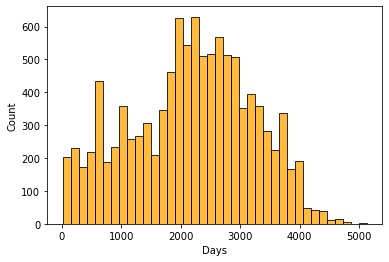

In [14]:
sns.histplot(x='host_tenure', data=train_df, color='orange')
plt.xlabel('Days')

### `host_location`

About 80% of the hosts' location are within Texas. On the other hand, only 18 listings are missing. Does a hosts proximity to the Airbnb affect how much they charge? I created a new predictor `in_texas` to measure the hosts proximity to their Airbnb. An 'unknown' category was created to track if the host's location was missing. We can see about 75% of hosts live in Texas, 20% live outside of the state and about 2% of listings do not have the host's location listed. `host_location` is no longer needed so it is dropped.

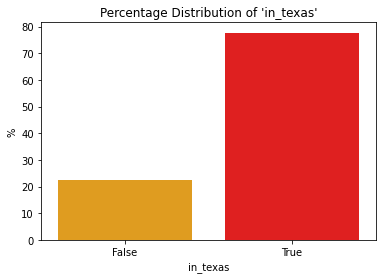

In [15]:
# Get distribution of if host is in Texas
df_host_loc = train_df.copy()
df_host_loc.dropna(subset='host_location', inplace=True)
df_host_loc['in_texas'] = np.where(df_host_loc['host_location'].str.contains('Texas', case=False), 1, 0)

get_normalized_count_plot(df_host_loc, 'in_texas', labels=['False', 'True'])

In [16]:
#Create predictor if host in texas
for df1 in df_list:
    df1['in_texas'] = np.where(df1['host_location'].str.contains('Texas', case=False), 'Yes', 'No')
    df1.loc[df1['host_location'].isnull(), 'in_texas'] = 'unknown'
    df1.drop('host_location', axis=1, inplace=True)

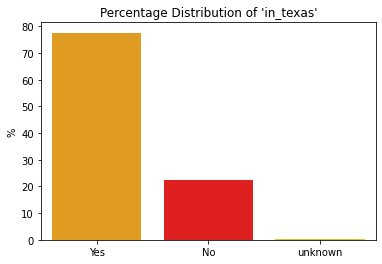

In [17]:
get_normalized_count_plot(train_df, 'in_texas')

### `host_response_time`

About 30% of listings are missing information for `host_response_time`. Understandibly, both `host_response_time` and  `host_response_rate` are missing for the same listings in the dataset. If a host doesn't respond to an inquiry, then they wouldn't have a rate.

Of the listings with a host response time, about 80% of the hosts responded within an hour. When considering the high amount of missing data within `host_response_time`, it's questionable if this predictor will provide much information. For now, we replaced the missing values with 'unkown'. However, further within the EDA we wil review the impact of the response time and the pricing of the Airbnb.

In [18]:
#Get count of rows where both host_response_time and host_response_rate are missing
time_rate_miss =train_df[
    train_df.loc[:, ['host_response_time', 
                                          'host_response_rate']] \
    .isnull().sum(axis=1) ==2].shape[0]

#Get missing counts where host_response_time is missing
time_miss = train_df[train_df['host_response_time'].isnull()].shape[0]

#Get missing counts where host_response_rate is missing
rate_miss = train_df[train_df['host_response_rate'].isnull()].shape[0]

print("Percentage of 'host_response_time' where 'host_response_rate is also missing: %d'" % 
      (time_rate_miss / time_miss))
print("Percentage of 'host_response_rate' where 'host_response_time is also missing: %d'" % 
      (time_rate_miss / time_miss))


Percentage of 'host_response_time' where 'host_response_rate is also missing: 1'
Percentage of 'host_response_rate' where 'host_response_time is also missing: 1'


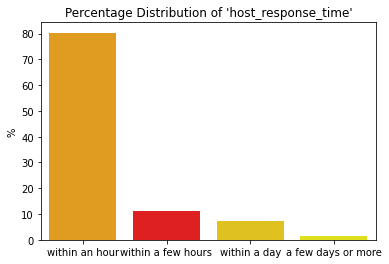

In [19]:
get_normalized_count_plot(train_df, 'host_response_time')

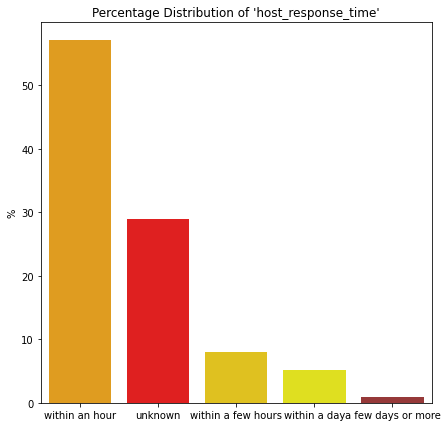

In [20]:
#After adding 'unknown' as part of the distribution
for df1 in df_list:
    df1['host_response_time'].fillna('unknown', inplace=True)

plt.figure(figsize=(7, 7))
get_normalized_count_plot(train_df, 'host_response_time')

### `host_response_rate`

About 80% of the received response rates are 100%. Very few listings have a rate below 80%. Because of the high percentage of missingness and listings with a 100% rating, the values are binned.

After binning, 86% of the listings either have a 100% host response rate or a horst response rate that is unknown.

<AxesSubplot:xlabel='host_response_rate', ylabel='Percent'>

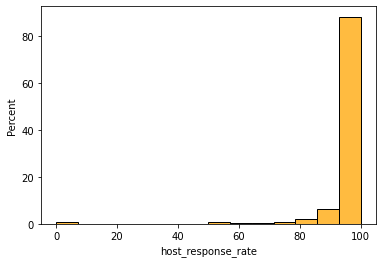

In [21]:
#Remove percentage sign from string and convert to numeric
for df1 in df_list:
    df1['host_response_rate'] = pd.to_numeric(df1['host_response_rate'].str.strip('%'))

sns.histplot(x='host_response_rate', data=train_df, stat='percent', color='orange')

In [22]:
#bin the predictor into 4 different levels
for df1 in df_list:
    df1['host_response_rate'] =  pd.cut(df1['host_response_rate'], 
                                        bins=[0, 90, 99, 100], 
           labels=['Less than 90', '90-99', '100']).astype('str'
                                        ).str.replace('nan', 'unknown')

train_df['host_response_rate'].value_counts(normalize=True)

100             0.563643
unknown         0.297001
90-99           0.073159
Less than 90    0.066196
Name: host_response_rate, dtype: float64

### `host_acceptance_rate`
Like the response rate, the host's acceptance rate is heavily skewed to the left with a large percentage for the
listings having a 100% host acceptance rate. The rates are placed into 5 bins.

After cleaning, we can see about 75% have an either have unknown acceptance rate or one higher than 90%.

<AxesSubplot:xlabel='host_acceptance_rate', ylabel='Percent'>

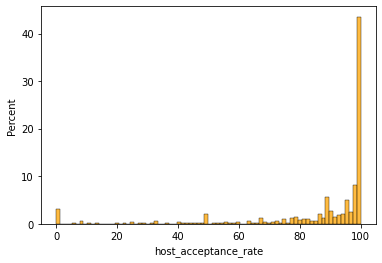

In [23]:
#Remove percentage sign from string and convert to numeric
for df1 in df_list:
    df1['host_acceptance_rate'] = pd.to_numeric(df1['host_acceptance_rate'].str.strip('%'))

sns.histplot(x='host_acceptance_rate', data=train_df, stat='percent', color='orange')

In [24]:
#bin the predictor into 6 different levels
for df1 in df_list:
    df1['host_acceptance_rate'] = pd.cut(df1['host_acceptance_rate'], 
                                         bins=[0, 70, 80, 90, 99, 100], 
           labels=['Less than 70', '70-80', '81-90', '91-99', '100']) \
    .astype('str').str.replace('nan', 'unknown')

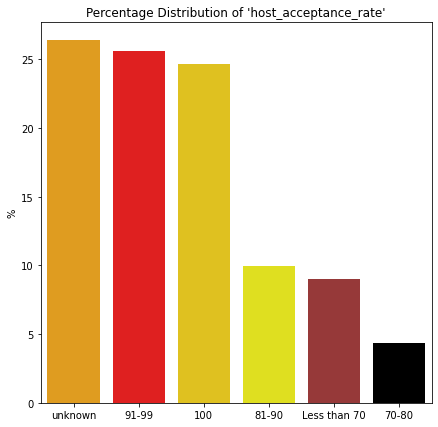

In [25]:
plt.figure(figsize=(7, 7))
get_normalized_count_plot(train_df, 'host_acceptance_rate')

### `host_neighbourhood`

I'll drop `host_neighbourhood` from the dataset since we are capturing the hosts proximity with `in_texas` and `zipcode`. The predictor fails to add information to the model. All cities listed are in Texas. The listings with hosts that do not live in texas have a value of `NaN`.

In [26]:
for df1 in df_list:
    df1.drop('host_neighbourhood', axis=1, inplace=True)

### `host_listings_count`
The value for `host_listing_count` and `host_total_listings_count` are the same for all listings. Therefore, I'll drop `host_total_listings_count`. Also, due to redundancy, the following predictors will be dropped as well:
   - `calculated_host_listings_count `
   - `calculated_host_listings_count_entire_homes`
   - `calculated_host_listings_count_private_rooms`
   - `calculated_host_listings_count_shared_rooms`

In [27]:
#Get the count of lisitngs where both predictors aren't equal
dif_listing_count = sum(train_df['host_total_listings_count'] != train_df['host_listings_count'])
print("The amount of listings where the host_total_listings_count is not the same as the host_listings_count: ",
     dif_listing_count)

The amount of listings where the host_total_listings_count is not the same as the host_listings_count:  0


In [28]:
#Drop unecessary columns
for df1 in df_list:
    df1.drop(['host_total_listings_count', 'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes',
              'calculated_host_listings_count_private_rooms', 'calculated_host_listings_count_shared_rooms'], inplace=True,
            axis=1)

### `neighbourhood`,  `neighbourhood_cleansed`

`neighbourhood_cleansed` contains the zipcode of each listing. I will drop `neighbourhood`. Also, `latitude` and `longitude` contain information regarding the property's location. However, we will use these predictors for EDA. Once EDA has been completed, the predictors will be dropped. Last, `neighbourhood_cleansed` is changed to `zipcode`.

In [29]:
#Remove neighbourhood, change to categorical type and change to appropriate name
for df1 in df_list:
    df1.drop('neighbourhood', axis=1, inplace=True)
    df1['neighbourhood_cleansed'] = pd.Categorical(df1['neighbourhood_cleansed'])
    df1.rename(columns={'neighbourhood_cleansed': 'zipcode'}, inplace=True)

### `Property Type ` and `Room Type`
Due to the free form text, `property_type` has large cardinality. The property type can be extracted and placed within one of the following bins:
   - House
   - Rental Unit
   - Apartment
   - Loft
   - Hotel
   - Other


`room_type` gives more detail on how much private space the guest will have during the stay. About 80% of listings provide the tenant with the entire unit. Hotel rooms are only available in hotels. Therefore, almost 0% of the listings are hotel rooms. To remove this correlation, we will replace 'Hotel room' with 'Private Room'. `property_type` states what type of building the guest is staying in.  Around 57% of listings provide a house,  25% a rental unit and 15% an aprartment.

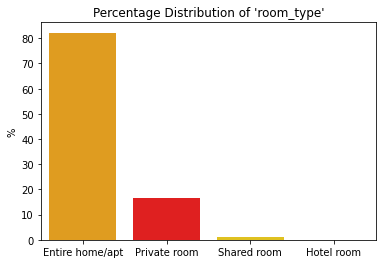

In [30]:
get_normalized_count_plot(train_df, 'room_type')

In [31]:
 for df1 in df_list:
    # Change Hotel room to a private room type
    df1.loc[df1['room_type'] == 'Hotel room', 'room_type'] = 'Private room'
    
    #Change free form text to categories for property_type
    df1.loc[df1['property_type'].str.contains(
        'home|house|cottage|bungalow|villa|chalet|guest suite| casa ', case=False), 'property_type'] = 'House'
    df1.loc[df1['property_type'].str.contains(
        'rental unit', case=False), 'property_type'] = 'Rental Unit'
    df1.loc[df1['property_type'].str.contains(
        'condominium | condo|apartment', case=False), 'property_type'] = 'Apartment'
    df1.loc[df1['property_type'].str.contains(
        'loft', case=False), 'property_type'] = 'Loft'
    df1.loc[df1['property_type'].str.contains(
        'hotel|resort|bed and breakfast', case=False), 'property_type'] = 'Hotel'
    df1.loc[~df1['property_type'].isin(
        ['House', 'Rental Unit', 'Apartment', 'Loft', 'Hotel']), 'property_type'] = 'Other'

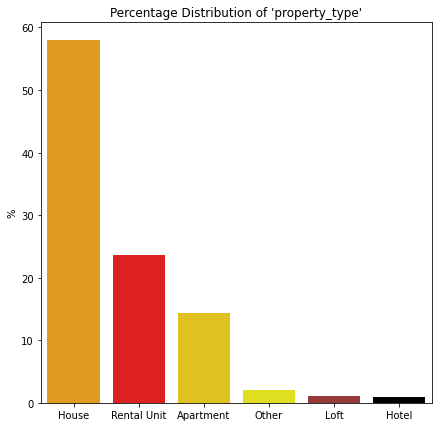

In [32]:
plt.figure(figsize=(7, 7))
get_normalized_count_plot(train_df, 'property_type')

### `bathrooms_text`

The original `bathrooms` contained no information. However,  we can extract the number of bathrooms from `bathrooms_text` and create a new `bathrooms` column. `bathrooms_text` will be dropped.

As expected, approximately 95% of listings have between 1.0 and 4.0 bathrooms.

In [33]:
#Extract bathroom count from string. Change to float.
for df1 in df_list:
    df1['bathrooms'] = df1['bathrooms_text'].str.extract(r'(\d*\.?\d+)').astype(float)
    df1.loc[df1['bathrooms_text'].str.contains('half-bath', case=False, na=False), 'bathrooms'] = 0.5
    df1.drop('bathrooms_text', axis=1, inplace=True)

median_bath = train_df['bathrooms'].median()

#Fill missing values with median bathroom count
for df1 in df_list:
    df1['bathrooms'].fillna(median_bath, inplace=True)

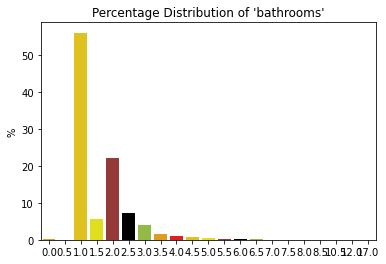

In [34]:
get_normalized_count_plot(train_df, 'bathrooms')

### `amenities`

Amenities describe the 'extra' things the guest receives with the property. Some examples are a pool, washer, dryer, or gym. Currenntly, the amenities predictor is a string of a list of amenities. I will convert the string into a list. Afterwards, I'll extract each amenity from the list and create a new column stating whether the listing has it or not.

After extraction, we can drop `wifi`, `air conditioning`, and `pet` as nearly 100% of the listings are skewed to either True or False.

In [35]:
def clean_list_as_string(val):
    """
        function for lambda to change from list in a string to list of strings
        
        val: string of the list
    """
    #remove unecessary brackets and double quotes from string
    val = val.strip("[]").replace(r"'", "").replace(", ", ",").replace('"', '').split(",")
    
    #remove unecessary beginning and ending whitespace
    val = list(map(str.strip, val))
    return val



def clean_amenities(df, col):
    """
        Clean each amenities string. Change from string of list to list of strings.
        
        col: the column name containing the amenities
    """
    
    df[col] = df[col].apply(clean_list_as_string)
    return df
    
    

def create_amenity_boolean_df(amenity_series, amenity_list):
    """
        Returns a dataframe stating whether each listing contained the specific amenity in their list
        
        amenity_series: series that contains the amenity list for each airbnb listing
        amenity_list: The list of amenities we want as predictors
    """
    
    amenity_dict = dict()
    for amenity in amenity_list:
        amenity = amenity.lower()
        
        #Create dictionary where each amenity is the key and the is a list of booleans. Each index in this list
        # matches with the row index of our original data frame.
        #The apply function iterates over each listing which checks to see if that amenity is in listings 
        # set of amenties. If it is, True is returned.
        amenity_dict[amenity] = amenity_series.apply(lambda x: any(amenity in string.lower() for string in x))
    return pd.DataFrame(amenity_dict)



def add_amenities(df, col, amenity_list):
    """
        Concatenate the boolean_df for the dataframe to the dataframe passed in the function
        
        df: DataFrame where the amenity series is located
        col: column containing the amenities
        amenity_list: The list of amenities we want as predictors
    """
    amenity_series = df[col]
    boolean_df = create_amenity_boolean_df(amenity_series, amenity_list)
    return pd.concat([df, boolean_df], axis=1)

In [36]:
# list of amenities we are concerned with
amenity_try = ['pool', 'wifi', 'kitchen', 'free parking', 'free street parking','hot tub', 'washer'
               ,'air conditioning', 'workspace', 'pet', 'gym']

#Create boolean predictors for each amenity in the 'amenity' column
train_df = clean_amenities(train_df, 'amenities')
train_df = add_amenities(train_df, 'amenities', amenity_try)
train_df.drop('amenities', axis=1, inplace=True)

test_df = clean_amenities(test_df, 'amenities')
test_df = add_amenities(test_df, 'amenities', amenity_try)
test_df.drop('amenities', axis=1, inplace=True)

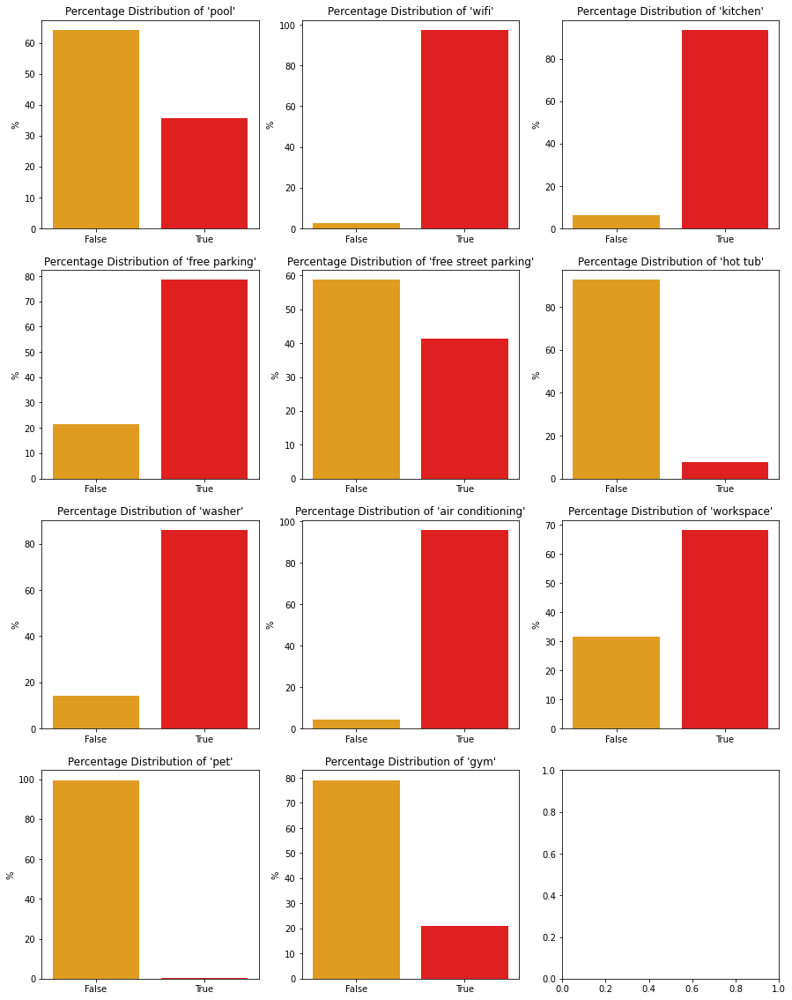

In [37]:
fig, ax = plt.subplots(4, 3, figsize=(15,20))
get_normalized_count_plot(train_df, 'pool', ax=ax[0,0])
get_normalized_count_plot(train_df, 'wifi', ax=ax[0,1])
get_normalized_count_plot(train_df, 'kitchen', ax=ax[0,2])
get_normalized_count_plot(train_df, 'free parking', ax=ax[1,0])
get_normalized_count_plot(train_df, 'free street parking', ax=ax[1,1])
get_normalized_count_plot(train_df, 'hot tub', ax=ax[1,2])
get_normalized_count_plot(train_df, 'washer', ax=ax[2,0])
get_normalized_count_plot(train_df, 'air conditioning', ax=ax[2,1])
get_normalized_count_plot(train_df, 'workspace', ax=ax[2,2] )
get_normalized_count_plot(train_df, 'pet', ax=ax[3,0])
get_normalized_count_plot(train_df, 'gym', ax=ax[3,1])

In [38]:
train_df.head()

,host_tenure,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_has_profile_pic,host_identity_verified,zipcode,latitude,longitude,property_type,room_type,accommodates,bedrooms,beds,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,instant_bookable,reviews_per_month,in_texas,bathrooms,pool,wifi,kitchen,free parking,free street parking,hot tub,washer,air conditioning,workspace,pet,gym
5022,3341,within a few hours,100,81-90,t,1.0,t,t,78702,30.27573,-97.70442,House,Entire home/apt,2,NaN,1.0,$99.00,3,1125,3.0,3.0,1125.0,1125.0,3.0,1125.0,t,1,11,41,131,11,4,0,2019-03-15,2021-10-26,4.91,f,0.30,Yes,1.0,False,True,False,False,True,False,False,True,False,False,False
1067,2684,within a few hours,100,100,f,0.0,t,t,78722,30.28148,-97.71742,House,Private room,1,1.0,1.0,$44.00,30,360,30.0,30.0,360.0,360.0,30.0,360.0,t,28,57,86,174,9,0,0,2015-03-19,2016-04-04,5.00,f,0.11,Yes,1.0,False,True,True,True,False,False,True,True,True,False,False
604,2948,unknown,unknown,unknown,f,1.0,t,f,78705,30.29925,-97.73819,House,Entire home/apt,10,4.0,6.0,"$1,200.00",1,1125,1.0,1.0,1125.0,1125.0,1.0,1125.0,f,0,0,0,0,0,0,0,NaN,NaN,NaN,f,NaN,No,3.0,False,True,True,True,False,False,True,True,False,False,False
1750,2701,unknown,unknown,unknown,f,1.0,t,t,78751,30.30511,-97.72662,House,Entire home/apt,2,NaN,1.0,$75.00,1,1125,1.0,1.0,1125.0,1125.0,1.0,1125.0,f,0,0,0,0,0,0,0,NaN,NaN,NaN,f,NaN,Yes,1.0,False,False,True,False,False,False,False,True,False,False,False
8342,342,within a day,Less than 90,81-90,f,5.0,t,t,78704,30.23769,-97.77817,House,Entire home/apt,6,3.0,3.0,$439.00,2,1125,2.0,2.0,1125.0,1125.0,2.0,1125.0,t,0,0,0,0,13,13,0,2021-07-09,2021-11-15,4.15,f,1.47,No,2.5,False,True,True,False,False,False,True,True,True,False,False


In [39]:
df_list = [train_df, test_df]
for df1 in df_list:
    df1.drop(['wifi', 'air conditioning', 'pet'], axis=1, inplace=True)

### `price`
We need to convert `price` from a string to a float.

Also, Airbnb doesn't allow a listing price [less than 10 dollars](https://www.google.com). Therefore, we will remove any row with a price less than 10 dollars.

The distribtuion of price is right-skewed and resembles a lognormal distribution. Airbnb has a max price filter of 12000 dollars: some of the listings in the dataset have prices well over the benchmark. Further research was conducted to find the accurate price of listings over 10000 dollars. The following correction were made:
   - A listing is priced at 20000 dollars. However, further research shows the pricing was 10000 dollars around March 20, 2022. The price has been adjusted to 10000 dollars

Most prices are listed between 75 and 300 dollars. Very few listings are more than $10000 a night. We need to keep in mind that the prices listed are advertised prices. Many hosts tend to list the maximum price or the "smart price" as their nightly prices. However, many of these hosts tend to let charge their clients much less.

In [40]:
#Change price from a string to a float
train_df['price'] = train_df['price'].str.replace("\$|,", "").astype('float')
train_df = train_df[train_df['price'] >= 10]

test_df['price'] = test_df['price'].str.replace("\$|,", "").astype('float')
test_df = test_df[test_df['price'] >= 10]

In [41]:
train_df[train_df['price'] >= 10000]

,host_tenure,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_has_profile_pic,host_identity_verified,zipcode,latitude,longitude,property_type,room_type,accommodates,bedrooms,beds,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,instant_bookable,reviews_per_month,in_texas,bathrooms,pool,kitchen,free parking,free street parking,hot tub,washer,workspace,gym
6507,787,a few days or more,unknown,unknown,f,0.0,t,t,78702,30.26065,-97.72315,Hotel,Private room,2,NaN,1.0,10000.0,1,1125,1.0,1.0,1125.0,1125.0,1.0,1125.0,t,30,60,90,365,0,0,0,NaN,NaN,NaN,t,NaN,No,1.0,False,False,False,False,False,False,False,False
10559,725,within a day,90-99,81-90,t,0.0,t,t,78702,30.25627,-97.73541,House,Entire home/apt,16,13.0,23.0,20000.0,3,7,3.0,3.0,7.0,7.0,3.0,7.0,t,7,7,7,260,0,0,0,NaN,NaN,NaN,f,NaN,Yes,7.5,True,True,True,False,False,True,True,False
3713,4057,unknown,unknown,unknown,f,1.0,t,t,78701,30.26809,-97.74971,Rental Unit,Entire home/apt,5,1.0,3.0,10000.0,500,1125,500.0,500.0,1125.0,1125.0,500.0,1125.0,t,30,60,90,180,1,0,0,2018-03-14,2018-03-14,5.0,f,0.02,Yes,1.0,True,True,False,False,False,True,True,True
10663,877,a few days or more,unknown,70-80,f,0.0,t,t,78702,30.26370,-97.73168,Hotel,Private room,4,1.0,1.0,10000.0,1,365,1.0,1.0,365.0,365.0,1.0,365.0,t,30,60,90,364,0,0,0,NaN,NaN,NaN,t,NaN,Yes,1.0,True,False,False,False,False,False,True,False
7312,1308,within an hour,100,Less than 70,f,46.0,t,t,78733,30.34310,-97.87865,House,Entire home/apt,16,8.0,15.0,14795.0,1,365,1.0,3.0,2.0,1125.0,2.3,247.6,t,28,58,88,360,0,0,0,NaN,NaN,NaN,t,NaN,Yes,7.5,True,True,True,False,False,True,True,True


<AxesSubplot:xlabel='price', ylabel='Count'>

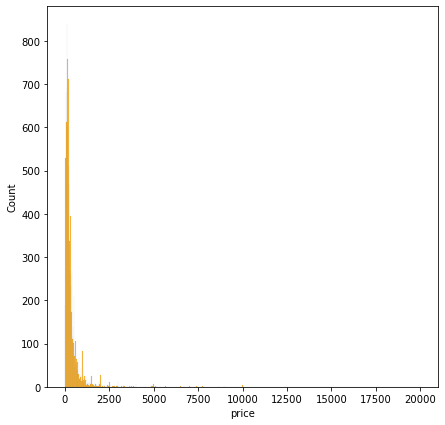

In [42]:
plt.figure(figsize=(7, 7))
sns.histplot(x='price', data=train_df, color='orange')

In [43]:
train_df.loc[train_df['price'] == 20000, 'price'] = 10000

<AxesSubplot:xlabel='price', ylabel='Count'>

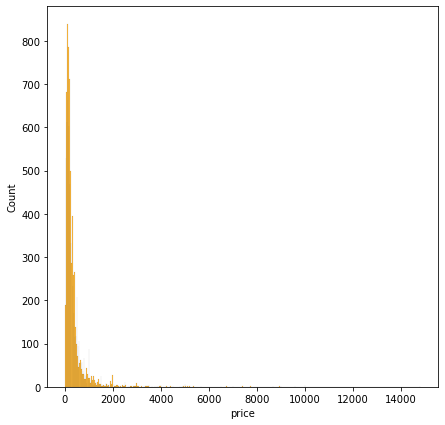

In [44]:
plt.figure(figsize=(7, 7))
sns.histplot(x='price', data=train_df, color='orange')

### `minimum_nights` and `maximum_nights`

`minimum_nights` states the required minimum nights to stay at the listing. `minimum_minimum_nights` is a value *Inside Airbnb* calculated to predict the minimum required nights for a listing in the next 365 days. The same concept applies to `maximum_nights` and `maximum_maximum_nights`. Most of the calculated `minimum_*` features are the same as `minimum_nights`. The same applies to `maximum_nights`. Thus, we will drop:
   - `minimum_minimum_nights`
   - `maximum_minimum_nights`
   - `minimum_maximum_nights`
   - `maximum_maximum_nights`
   - `minimum_nights_avg_ntm`
   - `maximum_nights_avg_ntm`
   
The distribution of `minimum_nights` is heavily right-skewed. 75% of listings require 1, 2, or 3 minimum nights. On the other hand, `maximum_nights` has a median maximum night count of 375 days. Over 4000 listings have a maximum night requirement of 1000 days.

In [45]:
dif_listing_count = (sum((train_df['minimum_nights'] != train_df['minimum_minimum_nights'])) / train_df.shape[0]) * 100
print('The % of listings where minimum_nights does not equal minimum_minimum_nights is', dif_listing_count)

dif_listing_count = (sum((train_df['maximum_nights'] != train_df['maximum_maximum_nights'])) / train_df.shape[0]) * 100
print('The % of listings where maximum_nights does not equal maximum_aximum_nights is', dif_listing_count)

The % of listings where minimum_nights does not equal minimum_minimum_nights is 7.763744427934621
The % of listings where maximum_nights does not equal maximum_aximum_nights is 20.533060921248143


In [46]:
#Drop uncessary minimum_features
df_list = [train_df, test_df]
for df1 in df_list:
    df1.drop(['minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights', 'maximum_maximum_nights',
              'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm'], axis=1, inplace=True)

In [47]:
#Get distribution of minimum nights
train_df['minimum_nights'].value_counts(normalize=True).head(5)

2     0.334881
1     0.309621
3     0.122493
30    0.106798
4     0.024981
Name: minimum_nights, dtype: float64

Text(0.5, 1.0, 'minimum_nights (<10)')

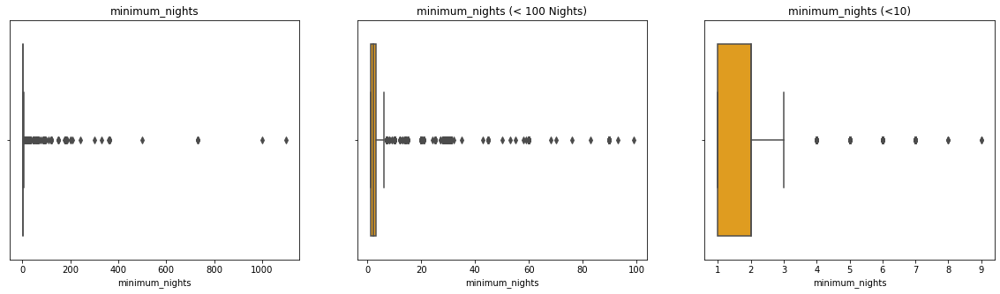

In [48]:
#Look at distribution of minimum nights
fig, ax = plt.subplots(1,3, figsize=(20,5))
sns.boxplot(x="minimum_nights", data=train_df, ax=ax[0], color='orange')
ax[0].set_title("minimum_nights")

sns.boxplot(x="minimum_nights", data=train_df[train_df['minimum_nights'] < 100], ax=ax[1], color='orange')
ax[1].set_title("minimum_nights (< 100 Nights)")

sns.boxplot(x="minimum_nights", data=train_df[train_df['minimum_nights'] < 10], ax=ax[2], color='orange')
ax[2].set_title("minimum_nights (<10)")

<AxesSubplot:xlabel='maximum_nights'>

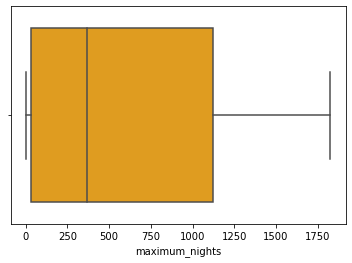

In [49]:
#Distribution of maximum nights
sns.boxplot(x="maximum_nights", data=train_df, color='orange')

<AxesSubplot:xlabel='maximum_nights', ylabel='Count'>

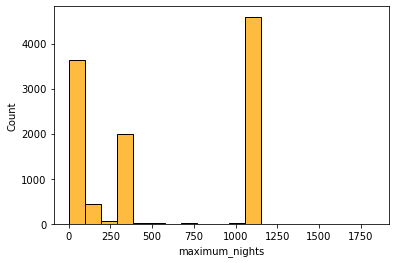

In [50]:
sns.histplot(x="maximum_nights", data=train_df, color='orange')

### has_availability
Similar to `minimum_nights`, the features related to `has_availability` are forecasts from *Inside Airbnb*. The predictors forecast at least 30% of the listings will be available for all 3 predictor availability predictors. However, currently 87% of listings are available. We will drop the following columns due to the uncertainty of how reliable the forecasts are:
   - `availability_30`
   - `availability_60`
   - `availability_90`

In [51]:
train_df['has_availability'].value_counts(normalize=True).head(5)

t    0.873328
f    0.126672
Name: has_availability, dtype: float64

In [52]:
train_df['availability_30'].value_counts(normalize=True).head(5)

0     0.408432
30    0.054978
10    0.031296
1     0.027953
8     0.026653
Name: availability_30, dtype: float64

In [53]:
train_df['availability_60'].value_counts(normalize=True).head(5)

0     0.346025
60    0.053027
10    0.016995
40    0.016159
31    0.015695
Name: availability_60, dtype: float64

In [54]:
train_df['availability_90'].value_counts(normalize=True).head(5)

0     0.316029
90    0.051542
83    0.012630
40    0.012444
70    0.012444
Name: availability_90, dtype: float64

In [55]:
train_df['availability_365'].value_counts(normalize=True).head(5)

0      0.281575
365    0.044112
364    0.006408
345    0.005944
70     0.005944
Name: availability_365, dtype: float64

In [56]:
for df1 in df_list:
    df1.drop(['availability_30', 'availability_60', 'availability_90', 'availability_365'], axis=1, inplace=True)

### number_of_reviews_ltm

Will remove `number_reviews_ltm` (number of reviews the last 12 months) and `reviews_per_month` due to their high correlation with `number_of_reviews`. 

Within the the last 30 days the listings were scraped, more than 90% of the listings have between 0 and 5 days. About 90% of listings have less than 100 reviews.

In [57]:
print('Correlation between # of reviews and # of reviews the last 12 months: ',
      train_df['number_of_reviews'].corr(train_df['number_of_reviews_ltm']))
print('Correlation between # of reviews and # of reviews the last 30 days: ',
      train_df['number_of_reviews'].corr(train_df['number_of_reviews_l30d']))
print('Correlation between # of reviews and # of reviews per months ',
      train_df['number_of_reviews'].corr(train_df['reviews_per_month']))

Correlation between # of reviews and # of reviews the last 12 months:  0.6883637747838995
Correlation between # of reviews and # of reviews the last 30 days:  0.47224232715841225
Correlation between # of reviews and # of reviews per months  0.5909687011603469


In [58]:
for df1 in df_list:
    df1.drop(['number_of_reviews_ltm', 'reviews_per_month'], axis=1, inplace=True)

<AxesSubplot:>

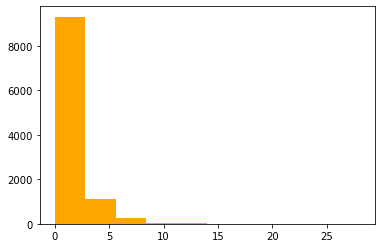

In [59]:
train_df["number_of_reviews_l30d"].hist(grid=False, color='orange')

<AxesSubplot:>

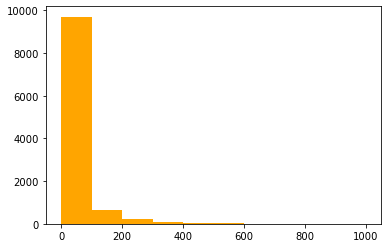

In [60]:
train_df["number_of_reviews"].hist(grid=False, color='orange')

### `first_review` and `last_review`
When reading reviews clients are evaluating the quality of the the lisitng. However, using the number of days from both `first_review` and `last_review` will measure the age more than the quality of the listing. Depending on the effect either predictor has on the price, the magnitude will be larger for older listings. As a result, we will drop both from the model

In [61]:
for df1 in df_list:
    df1.drop(['first_review', 'last_review'], axis=1, inplace=True)

### review_scores_rating

In [62]:
#Get non-nul reviews
df_review_rating = train_df[train_df['review_scores_rating'].notnull()]

#Get % of reviews greater than 4.5
df_review_rating[df_review_rating['review_scores_rating'] > 4.5].shape[0] / df_review_rating.shape[0]

0.8774582104228122

<AxesSubplot:>

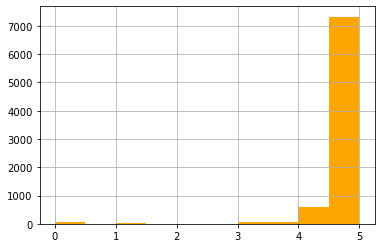

In [63]:
train_df['review_scores_rating'].hist(color='orange')

In [64]:
#Appropriate binning for heavily skewed predictor
for df1 in df_list:
    df1['review_scores_rating'] = pd.cut(df1['review_scores_rating'], bins=[0, 4, 4.6, 4.8, 4.99, 5], 
           labels=['Less than 4', '4-4.6', '4.6-4.8', '4.8-4.99', '5']).astype('str')
    df1['review_scores_rating'] = df1['review_scores_rating'].str.replace('nan', 'unknown')

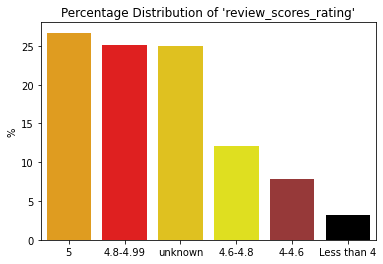

In [65]:
get_normalized_count_plot(train_df, 'review_scores_rating')

## `beds` and `bedrooms`

We are missing about 5% of `bedrooms` data and 1% of data for `beds`. We can fill missing values for both columns with their respective medians.

The distributions of beds and bedrooms are heavily skewed to the right, as expected. For both predictors, Most listings have less than 5. 

In [66]:
#Fill missing values with median of bedrooms
bed_median = train_df['beds'].median()
bedroom_median = train_df['bedrooms'].median()

for df1 in df_list:
    df1['beds'].fillna(bed_median, inplace=True)
    df1['bedrooms'].fillna(bedroom_median, inplace=True)

Text(0.5, 1.0, '# of Beds (<20)')

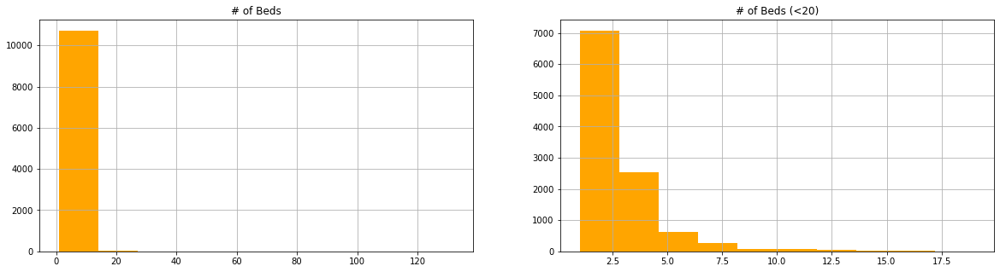

In [67]:
#Plot distribution of beds
fig, ax = plt.subplots(1,2, figsize=(20,5))
train_df['beds'].hist(ax=ax[0], color='orange')
ax[0].set_title('# of Beds')

train_df[train_df['beds'] < 20]['beds'].hist(ax=ax[1], color='orange')
ax[1].set_title('# of Beds (<20)')

Text(0.5, 1.0, '# of Bedrooms (<10)')

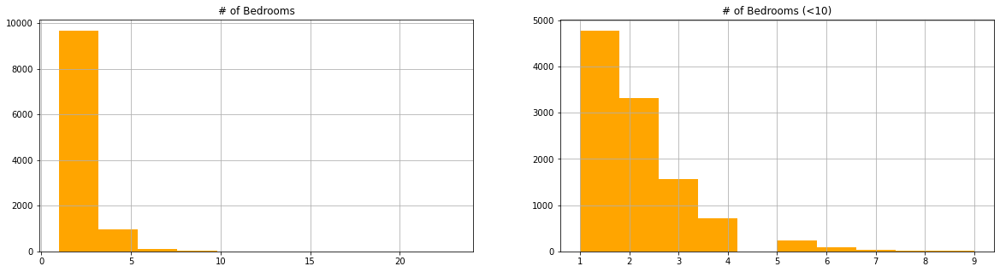

In [68]:
#Plot distribution of bedrooms
fig, ax = plt.subplots(1,2, figsize=(20,5))
train_df['bedrooms'].hist(ax=ax[0], color='orange')
ax[0].set_title('# of Bedrooms')

train_df[train_df['bedrooms'] < 10]['bedrooms'].hist(ax=ax[1], color='orange')
ax[1].set_title('# of Bedrooms (<10)')

In [69]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10768 entries, 5022 to 8809
Data columns (total 34 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   host_tenure             10768 non-null  int64   
 1   host_response_time      10768 non-null  object  
 2   host_response_rate      10768 non-null  object  
 3   host_acceptance_rate    10768 non-null  object  
 4   host_is_superhost       10768 non-null  object  
 5   host_listings_count     10768 non-null  float64 
 6   host_has_profile_pic    10768 non-null  object  
 7   host_identity_verified  10768 non-null  object  
 8   zipcode                 10768 non-null  category
 9   latitude                10768 non-null  float64 
 10  longitude               10768 non-null  float64 
 11  property_type           10768 non-null  object  
 12  room_type               10768 non-null  object  
 13  accommodates            10768 non-null  int64   
 14  bedrooms            

In [70]:
train_df.head(5)

,host_tenure,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_has_profile_pic,host_identity_verified,zipcode,latitude,longitude,property_type,room_type,accommodates,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,number_of_reviews,number_of_reviews_l30d,review_scores_rating,instant_bookable,in_texas,bathrooms,pool,kitchen,free parking,free street parking,hot tub,washer,workspace,gym
5022,3341,within a few hours,100,81-90,t,1.0,t,t,78702,30.27573,-97.70442,House,Entire home/apt,2,2.0,1.0,99.0,3,1125,t,11,0,4.8-4.99,f,Yes,1.0,False,False,False,True,False,False,False,False
1067,2684,within a few hours,100,100,f,0.0,t,t,78722,30.28148,-97.71742,House,Private room,1,1.0,1.0,44.0,30,360,t,9,0,5,f,Yes,1.0,False,True,True,False,False,True,True,False
604,2948,unknown,unknown,unknown,f,1.0,t,f,78705,30.29925,-97.73819,House,Entire home/apt,10,4.0,6.0,1200.0,1,1125,f,0,0,unknown,f,No,3.0,False,True,True,False,False,True,False,False
1750,2701,unknown,unknown,unknown,f,1.0,t,t,78751,30.30511,-97.72662,House,Entire home/apt,2,2.0,1.0,75.0,1,1125,f,0,0,unknown,f,Yes,1.0,False,True,False,False,False,False,False,False
8342,342,within a day,Less than 90,81-90,f,5.0,t,t,78704,30.23769,-97.77817,House,Entire home/apt,6,3.0,3.0,439.0,2,1125,t,13,0,4-4.6,f,No,2.5,False,True,False,False,False,True,True,False


### Post-Cleaning Thoughts
Overall, we dropped about 50 features while creating 10. Unfortunately, I believe the number of `bathrooms`, `restrooms`, `beds` and the number of `accommodates` will be highly correlated. This can cause issues when modeling data. First, multicollinearity can increase a predictor's variance. Also, if they are collinear, then we are overfitting data in every model. Thus, we may need to drop some of them. However, they are important when discussing the prices of a house. Therefore, we will wait until we review multicollinearity before dropping them.

In [71]:
train_df.to_csv('data/train_df')
test_df.to_csv('data/test_df')

# Exploratory Data Analysis

Earlier we took a quick glance at the distribtuions of different predictors. Now, we will take a further look into  a few predictors and their relationship to our dependent variable: `price`.

First, `price` is heavily skewed to the right. About 817 listings are priced at more than 1000 dollars per night. A majority of listings lie between 0 and 400 dollars. It's important to note that Airbnb doesn't allow a property to list under 10 dollars a night. Two listings have a price for over 10000 dollars. The prices do not seem to be an error as one house has 23 beds with numerous amenities and the other has 15 beds a variety of amenities as well.

In [72]:
print('The # of listings with a price above $1000: ', train_df[train_df['price'] > 800].shape[0])

The # of listings with a price above $1000:  817


Text(0, 0.5, '# of listings')

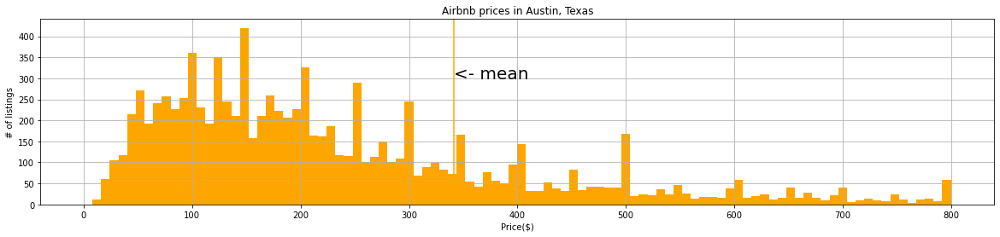

In [73]:
price_mean = train_df['price'].mean()

plt.figure(figsize=(20,4))
train_df.price.hist(bins=100, range=(0,800), color='orange')
plt.axvline(price_mean, color='orange')
plt.annotate('<- mean', xy= (price_mean,300), fontsize=20, color='black')
plt.title('Airbnb prices in Austin, Texas')
plt.xlabel('Price($)')
plt.ylabel('# of listings')

### `host_tenure`

For listings priced for less than 500 dollars, hosts with a tenure between 500 and 1000 days have much more listings than hosts (by about 15 listings). On the otherhand, for listings prices more than 500 dollars, hosts with a tenure between 1000 and 2000 days tend to have more listings than hosts with a tenure outside of the range.

Text(0, 0.5, 'Host Listings Count')

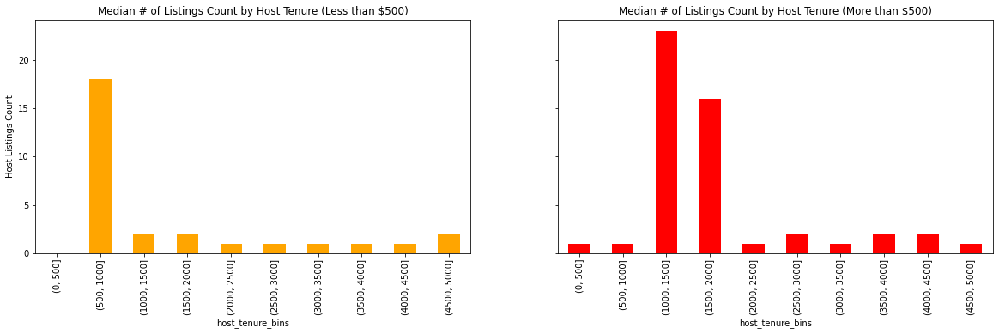

In [74]:
df2 = train_df.copy()
df2['host_tenure_bins'] = pd.cut(df2['host_tenure'], 
                                 bins=[0,500, 1000, 1500, 2000, 2500, 3000, 3500, 4000, 4500, 5000])
fig, ax = plt.subplots(1,2, figsize=(20,5), sharey=True)

df2[df2['price'] < 500].groupby('host_tenure_bins')['host_listings_count'].median().plot.bar(color='orange', ax=ax[0])
ax[0].set_title('Median # of Listings Count by Host Tenure (Less than $500)')
ax[0].set_ylabel('Host Listings Count')

df2[df2['price'] > 500].groupby('host_tenure_bins')['host_listings_count'].median().plot.bar(color='red', ax=ax[1])
ax[1].set_title('Median # of Listings Count by Host Tenure (More than $500)')
ax[1].set_ylabel('Host Listings Count')

### `host_response_time`

Hosts of the more expensive properties tend to take longer to response to inquiries. Surprisingly, the hosts that have an unknown response time have cheaper listing prices.

Text(0.5, 1.0, 'Price by Hosts Response Time')

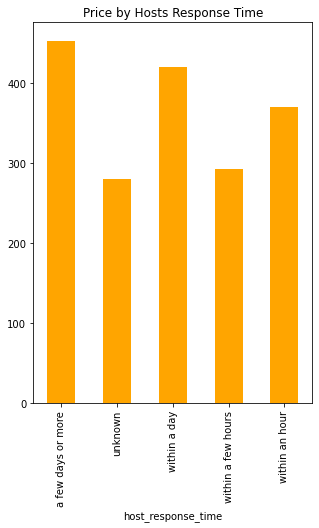

In [75]:
plt.figure(figsize=(5,7))
df2.groupby('host_response_time')['price'].mean().plot.bar(color='orange')
plt.title('Price by Hosts Response Time')

### `host_is_superhost`

Listings without a superhost have sligtly lower prices than those that do. A superhost is someone who goes above and beyond for their tenants. One would expect to pay more for high quality service. There are quite a few outlier in both distributions. This is expected as larger and better quality properties will price much higher than average ones.

<AxesSubplot:xlabel='price', ylabel='host_is_superhost'>

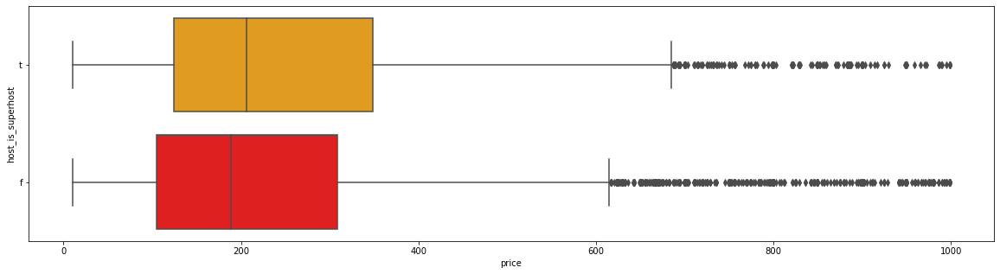

In [76]:
plt.figure(figsize=(20,5))
df2 = train_df[train_df['price'] < 1000]
sns.boxplot(df2['price'], df2['host_is_superhost'], orient="h", palette= {"t": "orange", "f": "red"})

### `host_has_profile_pic`

Almost 100% of the listings have hosts with a profile pic. I will drop this predictor as it won't provide much information to our model.

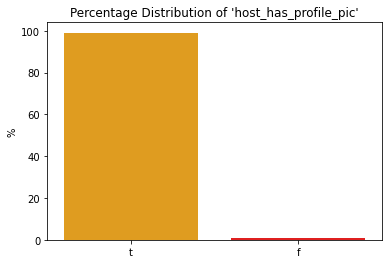

In [77]:
get_normalized_count_plot(train_df, 'host_has_profile_pic')

In [78]:
for df1 in df_list:
    df1.drop('host_has_profile_pic', axis=1, inplace=True)

### `property_type` and `room_type`

Hosts of hotel rooms tend to have more variable prices than other property types. This is understandable due to the varying types of hotel rooms available. Cheaper hotel may contain a bed and a television. On the other end, expensive hotel rooms tend to have more luxurious features such as hot tubs, private pools, multiple bedrooms. Also, it is understandable that hotel rooms are more expensive. Airbnb was created to create a cheaper alternative to hotel rooms. Thus, hotel rooms advertised on the platform will be more expensive. 

Overall, it is more expensive to rent an entire home or apartment. Shared rooms are more expensive for hotel rooms and lofts than private rooms, otherwise they are prices relatively the same.

Text(0.5, 1.0, 'Price of listing by Room and Property Type')

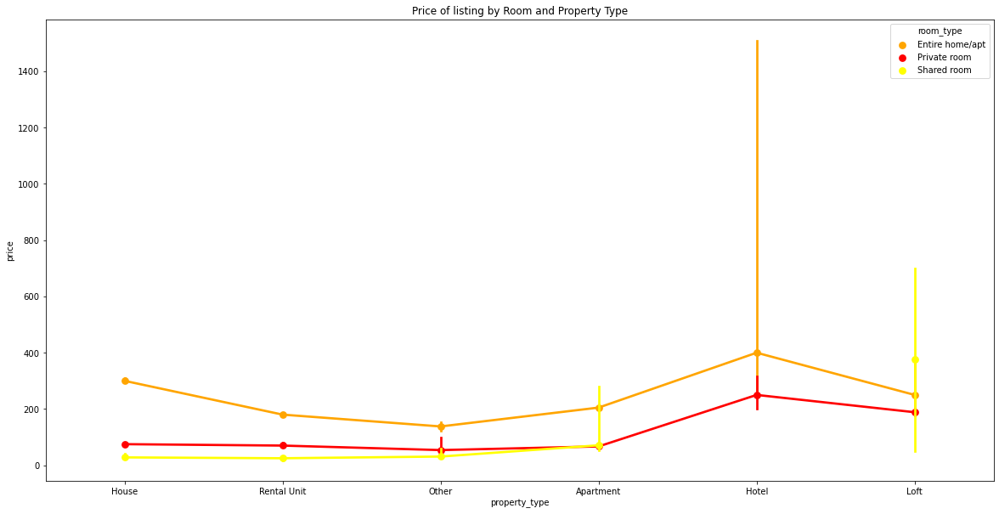

In [79]:
plt.figure(figsize=(20,10))
sns.pointplot(x='property_type', y='price', hue='room_type', data=train_df, estimator=np.median,
            palette= {"Entire home/apt": "orange", "Private room": "red", "Shared room": "yellow"})
plt.title('Price of listing by Room and Property Type')

### `accomodates`,  `bedrooms`,  `beds`

For all three predictors, price increases as the quantity increases.

`beds` has a few outliers. However, upon further research, we found the data to be accurate. The outlier beds represent the following:
   - 132 beds: The host is lending an entire lodge that hosts a large size of people
   - 61 beds: An entire hotel is available for renting
   - 39 beds: An entire townhouse with a pool and roofdeck
   - 26 bedrs: An entire townhose with a pools and roof deck

The confidence interval for listings with 13 `bedrooms` is quite large. The listing which is causing a the large standard error is listed at a price of 10000 dollars while the other two cost 2532 and 1704 dollars. The 10000 dollar listing a is a property connecting two houses in one of the most coveted areas in Austin. On the other hand, the 2532 dollar home is on a campground and the 1704 is a house in a typical Austin residential neighborood. The large variance with a small sample size makes the large confidence interval accurate.

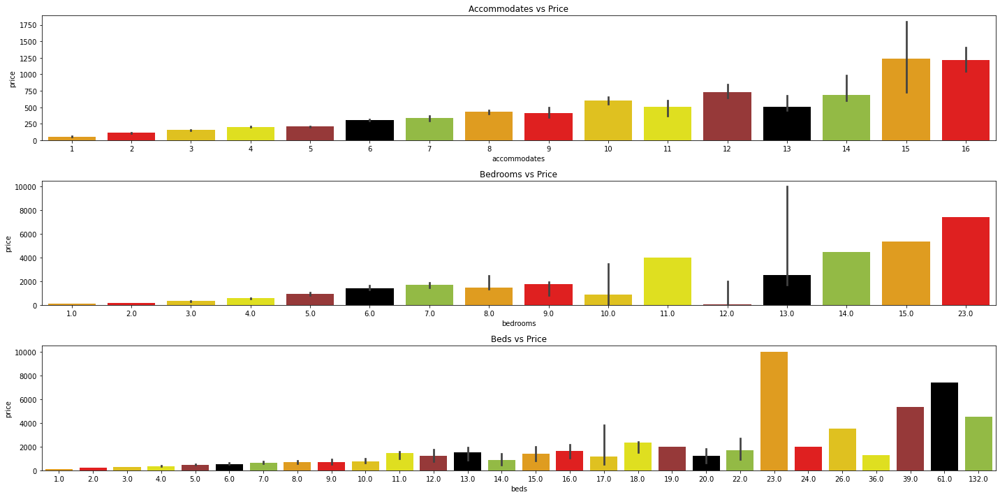

In [80]:
fig, ax = plt.subplots(3,1, figsize=(20,10))
sns.barplot(x='accommodates', y='price', data=train_df, ax=ax[0], estimator=np.median, palette = colors)
ax[0].set_title('Accommodates vs Price')

sns.barplot(x='bedrooms', y='price', data=train_df, ax=ax[1], estimator=np.median, palette=colors)
ax[1].set_title('Bedrooms vs Price')

sns.barplot(x='beds', y='price', data=train_df, ax=ax[2], estimator=np.median, palette=colors)
ax[2].set_title('Beds vs Price')
fig.tight_layout()

### `Latitude`, `Longitude` and `zipcode`

The three most expensive airbnbs are located in the northwest area of Austin Most predominantly, they are located near  Lae Travis and downtown. of expensive Airbnb's are located either downtown or on the west side of Austin. All other price ranges seem to be evenly dispersed throughout Austin. The least expensive areas are located in southern Austin.

In [81]:
df= train_df.copy()

AUSTIN_COORD = [30.2672, -97.7431]
quantiles = np.quantile(df['price'], q=[0.0, 0.2, 0.4, 0.6, 0.8, 1])
print(quantiles)
df['price_cut'] = pd.cut(x=df['price'], bins=quantiles, labels=np.arange(1,6))
df['price_cut'] = pd.to_numeric(df['price_cut'])
df['price_cut']. fillna(1, inplace=True)
print(df['price_cut'].unique())

cmap = cm.LinearColormap(colors=["darkorange", "gold", "lawngreen", "lightseagreen", 'blue'],
                        vmin=1, vmax=5)
austin_map = folium.Map(location = AUSTIN_COORD, width=950, height=550,
                       zoom_start=10.5, tiles= 'cartodb positron')

for lat, long, price in zip(df['latitude'], df['longitude'], df['price_cut']):
    folium.Circle(
        location = [lat, long],
        radius=5,
        fill = True,
        color = cmap(price)
    ). add_to(austin_map)

austin_map.add_child(cmap)

[1.0000e+01 1.0000e+02 1.6600e+02 2.5000e+02 4.2660e+02 1.4795e+04]
[1. 5. 2. 3. 4.]


<AxesSubplot:xlabel='zipcode', ylabel='price'>

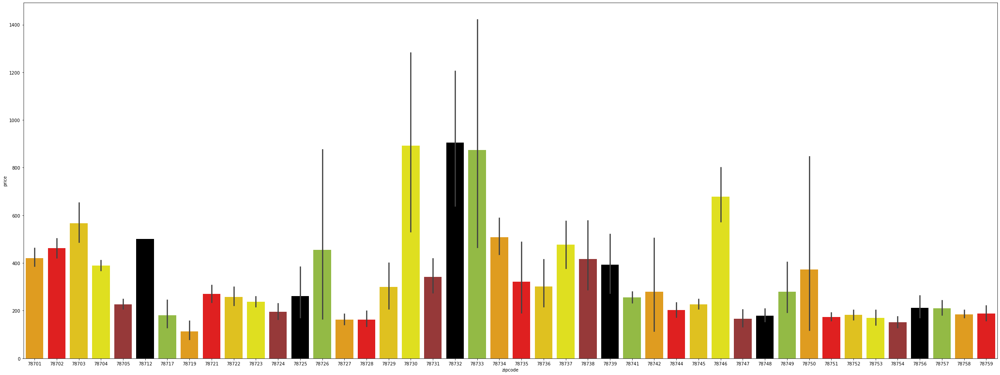

In [82]:
plt.figure(figsize=(40,15))
sns.barplot(x='zipcode', y='price', data=train_df, palette=colors)

In [83]:
for df1 in df_list:
    df1.drop(['latitude', 'longitude'], inplace=True, axis=1)

In [84]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10768 entries, 5022 to 8809
Data columns (total 31 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   host_tenure             10768 non-null  int64   
 1   host_response_time      10768 non-null  object  
 2   host_response_rate      10768 non-null  object  
 3   host_acceptance_rate    10768 non-null  object  
 4   host_is_superhost       10768 non-null  object  
 5   host_listings_count     10768 non-null  float64 
 6   host_identity_verified  10768 non-null  object  
 7   zipcode                 10768 non-null  category
 8   property_type           10768 non-null  object  
 9   room_type               10768 non-null  object  
 10  accommodates            10768 non-null  int64   
 11  bedrooms                10768 non-null  float64 
 12  beds                    10768 non-null  float64 
 13  price                   10768 non-null  float64 
 14  minimum_nights      

In [85]:
# train_df.to_csv('data/train_df')
# test_df.to_csv('data/test_df')

# Model Preparation
To begin, we will need to adjust our datatypes. It is good to note that although currency is typically represented as a continuous data point, on Airbnb, price is always listed as an integer. Therefore, it will be represented as an integer in our models. 

In [86]:
for df1 in df_list:
    df1['price'] = df1['price'].astype('int64')
    df1['pool'] = df1['pool'].astype('category')
    df1['kitchen'] = df1['kitchen'].astype('category')
    df1['free parking'] = df1['free parking'].astype('category')
    df1['free street parking'] = df1['free street parking'].astype('category')
    df1['hot tub'] = df1['hot tub'].astype('category')
    df1['washer'] = df1['washer'].astype('category')
    df1['workspace'] = df1['workspace'].astype('category')
    df1['gym'] = df1['gym'].astype('category')
    

### Testing Multicollinearity

Testing our data for multicollinnearity is important. We cannot determine the individual effectiveness of predictors when our predictors are collinear.

In [87]:
y_train, y_test = train_df['price'], test_df['price']
x_train = train_df.drop('price', axis=1)
x_test = test_df.drop('price', axis=1)

In [88]:
x_train, x_valid, y_train, y_valid = tst(x_train, y_train, test_size=0.20, random_state=15444)

`bedrooms`, `beds`, `accomodates` and `bathrooms` are highly correlated to each other. This aligns with out beginning hypothessis that all 4 predictors would are related. The more people needed for housing, the more bedrooms, beds and bathrooms are desired. Multicollinearity is determinental when attempting to understand the effects of individual predictors on a model in regression analysis. However, it doesn't affect prediction. Regardless, we do not want to use predictors that provide redundant information. Therefore, I will drop `bedrooms`, `beds`, and `bathrooms`. When searching for airbnbs, it's most popular for tenants to search for properites that can lodge all members of the group. Therefore, it is best to measure the price with how many people the property can accommodate.

It is also good to note `number_of_reviews_l30d` and `number_of_reviews` are slightly correlated; however, the correlation is not bad so we will keep it in the model.

<AxesSubplot:>

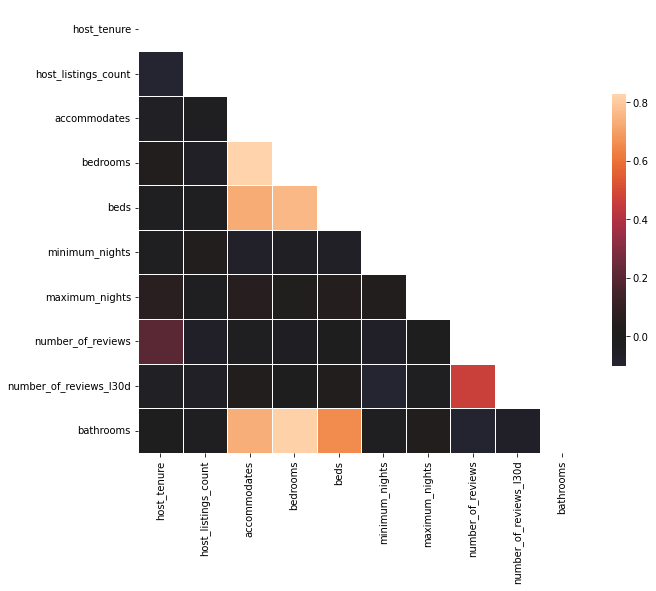

In [89]:
plt.figure(figsize=(10,10))
corr = x_train.corr()

mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask) ] = True

sns.heatmap(corr, mask=mask, center=0, square=True, linewidths=0.5, cbar_kws={"shrink": 0.5})

In [90]:
x_train.drop(['bedrooms', 'beds', 'bathrooms'], axis=1, inplace=True)
x_valid.drop(['bedrooms', 'beds', 'bathrooms'], axis=1, inplace=True)
x_test.drop(['bedrooms', 'beds', 'bathrooms'], axis=1, inplace=True)

To prepare our model, we need to create dummy variables for our datasets. We will create two 

In [91]:
df_concat = pd.concat([x_train, x_valid, x_test], axis=0)
df_concat['zipcode'] = df_concat['zipcode'].astype('category')
df_concat = pd.get_dummies(df_concat, drop_first=True)
df_concat.columns = df_concat.columns.str.replace(' ','_')


valid_end_indice = len(x_train) + len(x_valid)
x_train = df_concat.iloc[:len(x_train)]
x_valid = df_concat[len(x_train):valid_end_indice]
x_test = df_concat.iloc[valid_end_indice:]

In [92]:
x_test

,host_tenure,host_listings_count,accommodates,minimum_nights,maximum_nights,number_of_reviews,number_of_reviews_l30d,host_response_time_unknown,host_response_time_within_a_day,host_response_time_within_a_few_hours,host_response_time_within_an_hour,host_response_rate_90-99,host_response_rate_Less_than_90,host_response_rate_unknown,host_acceptance_rate_70-80,host_acceptance_rate_81-90,host_acceptance_rate_91-99,host_acceptance_rate_Less_than_70,host_acceptance_rate_unknown,host_is_superhost_t,host_identity_verified_t,zipcode_78702,zipcode_78703,zipcode_78704,zipcode_78705,zipcode_78712,zipcode_78717,zipcode_78719,zipcode_78721,zipcode_78722,zipcode_78723,zipcode_78724,zipcode_78725,zipcode_78726,zipcode_78727,zipcode_78728,zipcode_78729,...,zipcode_78746,zipcode_78747,zipcode_78748,zipcode_78749,zipcode_78750,zipcode_78751,zipcode_78752,zipcode_78753,zipcode_78754,zipcode_78756,zipcode_78757,zipcode_78758,zipcode_78759,property_type_Hotel,property_type_House,property_type_Loft,property_type_Other,property_type_Rental_Unit,room_type_Private_room,room_type_Shared_room,has_availability_t,review_scores_rating_4.6-4.8,review_scores_rating_4.8-4.99,review_scores_rating_5,review_scores_rating_Less_than_4,review_scores_rating_unknown,instant_bookable_t,in_texas_Yes,in_texas_unknown,pool_True,kitchen_True,free_parking_True,free_street_parking_True,hot_tub_True,washer_True,workspace_True,gym_True
8055,725,0.0,1,90,100,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,1,0,1,1,1,0,0,1,1,0
2570,2976,1.0,1,1,1125,3,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0
8396,822,9.0,8,1,112,4,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,1,1,1,1,1,1,0
618,2945,1.0,2,1,1125,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0
7983,3683,5.0,6,1,1125,74,2,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,1,1,0,0,1,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5816,932,0.0,2,1,30,6,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,1,0,1,1,1,0,0,1,0,0
9559,3336,27.0,4,2,1125,14,1,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,1,0,0,0,1,1,0
9798,1014,0.0,6,30,365,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,1,1,0,0,1,1,0,0,1,1,0
11276,2484,3.0,7,1,365,5,5,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,1,1,1,0,1,1,0


In [93]:
scaler = StandardScaler()
scaler.fit(x_train)
x_train_std = pd.DataFrame(scaler.transform(x_train), columns= x_train.columns)
x_valid_std = pd.DataFrame(scaler.transform(x_valid), columns= x_train.columns)
x_test_std = pd.DataFrame(scaler.transform(x_test), columns= x_train.columns)

# Modeling

I will evaluate the following models for use:
   - Log of Y Linear Regression
   - Ridge Regression
   - XGBoost
   

Linear regression is a great model due to the the interpretability. However, a majority of cases do not meet the normality assumption. Our response  variable is nonnegative. Would someone list their property on Airbnb to give you money? If so, please send me the listing link! Because of this, a normal linear regression model is not appropriate. A downfall is, multicollinearity may cause issues interpreting the affects of different predictors. 

Ridge regression is uses regulation to punish collinear predictors. The model could help us find a smaller subset of predictors while handling our multicollinearity problem. However, the model can become problematic as it still uses least squares to measure MSE. Thus, it is very susceptible to outliers and can cause prediction issues. As we saw earlier, our data has contains a few outliers. 

Last, XGBoost can make accurate predictions when our model is not linear. Collinear predictors do not affect model prediction and, because distance measures are not used, it is not susceptible to ouliers. KNN and SVM regression were both considered, however, both models would have been heavily influenced by the price outliers.

In [94]:
#create lists to track R-squared and MSE
fnl_r_squareds = []
fnl_mse = []
fnl_model_name = []

### Model 1: Log Normal Linear Regression

As stated before, Linear Regression is the best model when attempting to interpret how different predictors affect a response variable. However, Linear Regression requires the relationship between X and Y to be linear. If not, some issues can arist. In our case, we know the relationship between X and Y will not be linear. Thus, we building a regression model on the log of the price.

When first looking at our model, we see we have numerous predictors that are insignificant. First, we must address any collinearity issues within the model.

In [95]:
def get_vifs(df):
    """
        Get a VIF for each predictor
        df: a dataframe containing all of the predictors.
    """
    vif = {}
    #Create dictionary of predictor vifs
    for i in range(len(df.columns)):
        vif[df.columns[i]] = variance_inflation_factor(df.values,i)
    return pd.DataFrame(vif.items(), columns=['Predictor', 'Variance Inflation Factor']).sort_values(
        by='Variance Inflation Factor', ascending=False)

In [96]:
import statsmodels.formula.api as smf
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn import linear_model
from sklearn.metrics import mean_squared_error

In [105]:
#Log transform the predictor
y_train_log = np.log(y_train)
y_valid_log = np.log(y_valid)
y_test_log = np.log(y_test)

model1 = sm.OLS(y_train_log, sm.add_constant(x_train)).fit()
print(model1.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.598
Model:                            OLS   Adj. R-squared:                  0.594
Method:                 Least Squares   F-statistic:                     144.3
Date:                Wed, 12 Oct 2022   Prob (F-statistic):               0.00
Time:                        20:39:19   Log-Likelihood:                -7633.5
No. Observations:                8614   AIC:                         1.544e+04
Df Residuals:                    8525   BIC:                         1.607e+04
Df Model:                          88                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

## Linear Regression Assumptions

Before we can interpret information from our model, we must make sure the assumptions on our model have been met. If these assumptions are met, we can assume a linear model is approprirate:

- Linearity of the Model
    - in linear regression, our dependent variable is assumed to have a linear relationship with the systematic component (the set of predictors and their coefficients). In our case, we took the log of the dependent variable so this relationship would occur. Thus, our model is now considered a *Log-Normal Regression Model*. If we do not meet the linearity assumption, then our model can cause serious prediction errors. As we can see by the plot, our our Log Normal Regression model fits the linearity assumption

- Homoscedasticity
    - This is just a fancy term for constant variance. Constant variance is important because the subsets of data with a larger error variance will have a larger influence on the subset of coefficient estimates. Thus, if your model has a larger variance for the smaller dependent values, then their predictors would be more influential. In our case, as we can see by the *Residuals vs Predicted Values* Plot, th residuals have a constant variance around the 0 residual. Thus, we have constant variance in our model.
    
- Normality
    - Also, we need to assume the residuals of our model follow a normal distribution. Again, this can be demonstratated by the "Residuals vs Fitted Valuess".
    

[Text(0.5, 0, 'Fitted'), Text(0, 0.5, 'Residuals')]

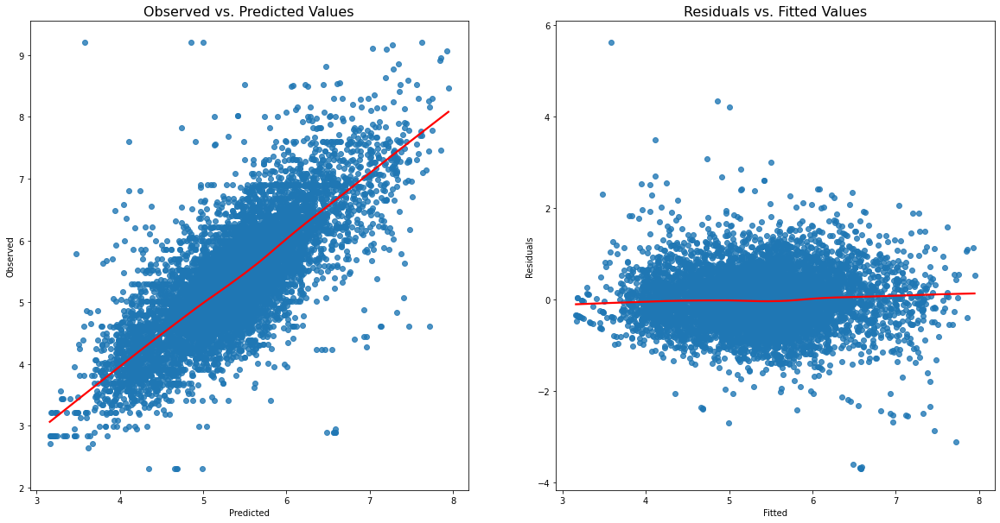

In [109]:
fitted_vals = model1.predict()
resids = model1.resid

fig, ax = plt.subplots(1,2, figsize=(20,10))

sns.regplot(x=fitted_vals, y=y_train_log, lowess=True, ax=ax[0], line_kws={'color': 'red'})
ax[0].set_title('Observed vs. Predicted Values', fontsize=16)
ax[0].set(xlabel='Predicted', ylabel='Observed')

sns.regplot(x=fitted_vals, y=resids, lowess=True, ax=ax[1], line_kws={'color': 'red'})
ax[1].set_title('Residuals vs. Fitted Values', fontsize=16)
ax[1].set(xlabel='Fitted', ylabel='Residuals')


<AxesSubplot:>

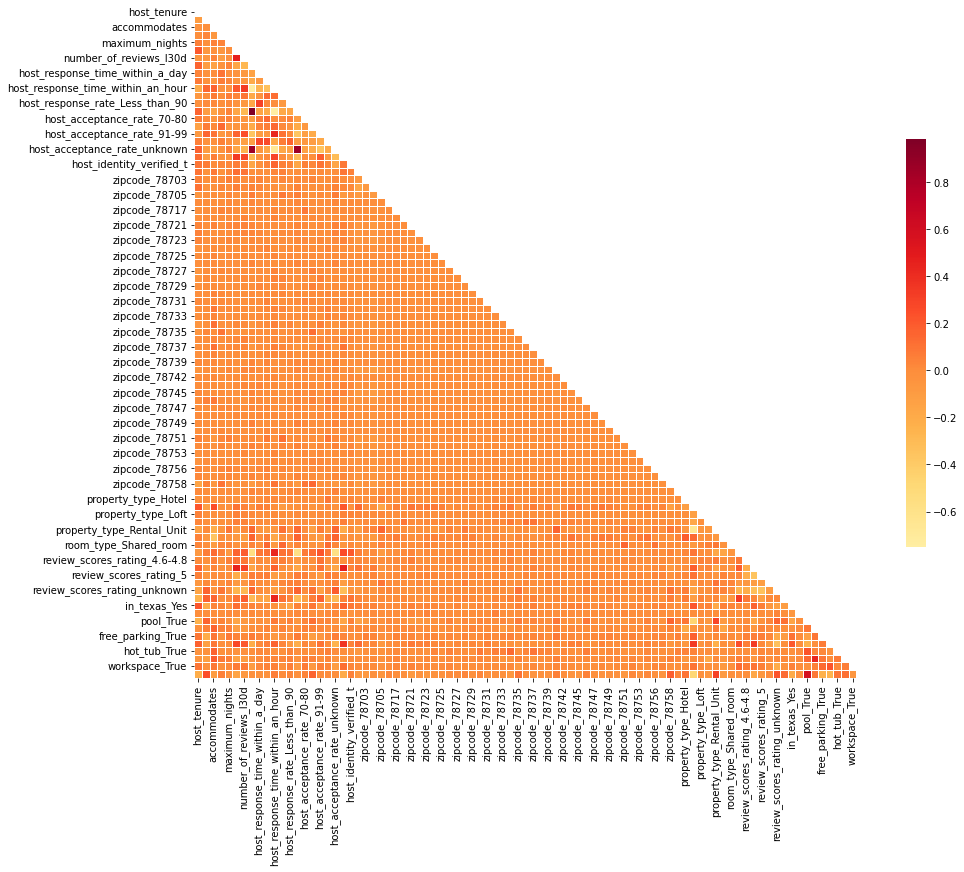

In [435]:
#Create Correlation heatmap
plt.figure(figsize=(15,15))
corr = x_train_std.corr()

mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask) ] = True

sns.heatmap(corr, cmap='YlOrRd', mask=mask, center=0, square=True, linewidths=0.5, cbar_kws={"shrink": 0.5})

None of the zipcode factors have collinearity with other variables. We can get a better look at the other predictors by creating another heatmap without the `zipcode` predictors.

In addition to creating a correlation heatmap I calculated a variance inflaction factor for each predictor (VIF). VIF's tell us how correlated a predictor is to all other predictors. Viewing the heatmap, we can see `host_response_rate_unknown` is heavily correlated with: `host_response_time_unknown`, `host_response_time_within_an_hour`, `host_acceptance_rate_unknown`, `host_is_superhost_t`, `has_availability_t`, and  `instant_bookable_t`. This is confirmed by having a VIF factor of 64. Therfore, we dropped it from the dataset. Typically, a VIF above 10 is highly concerning and anyhting above 5 needs consideration to be dropped. 

`pool_True` and `gym_true` were also higly correlated. Because `pool_true` is more correlated with `price`, I decided to keep it. Other predictors dropped due to collineaerity issues are:
   - `host_response_time_within_a_few_hours`
   - `host_response_time_within_an_hour`
   - `host_response_time_unknown`
   - `host_response_time_within_a_day`
   - `has_availability_t`
   - `kitchen_True`
   - `property_type_House`
   - `gym_True`
   - `host_is_superhost_t`

<AxesSubplot:>

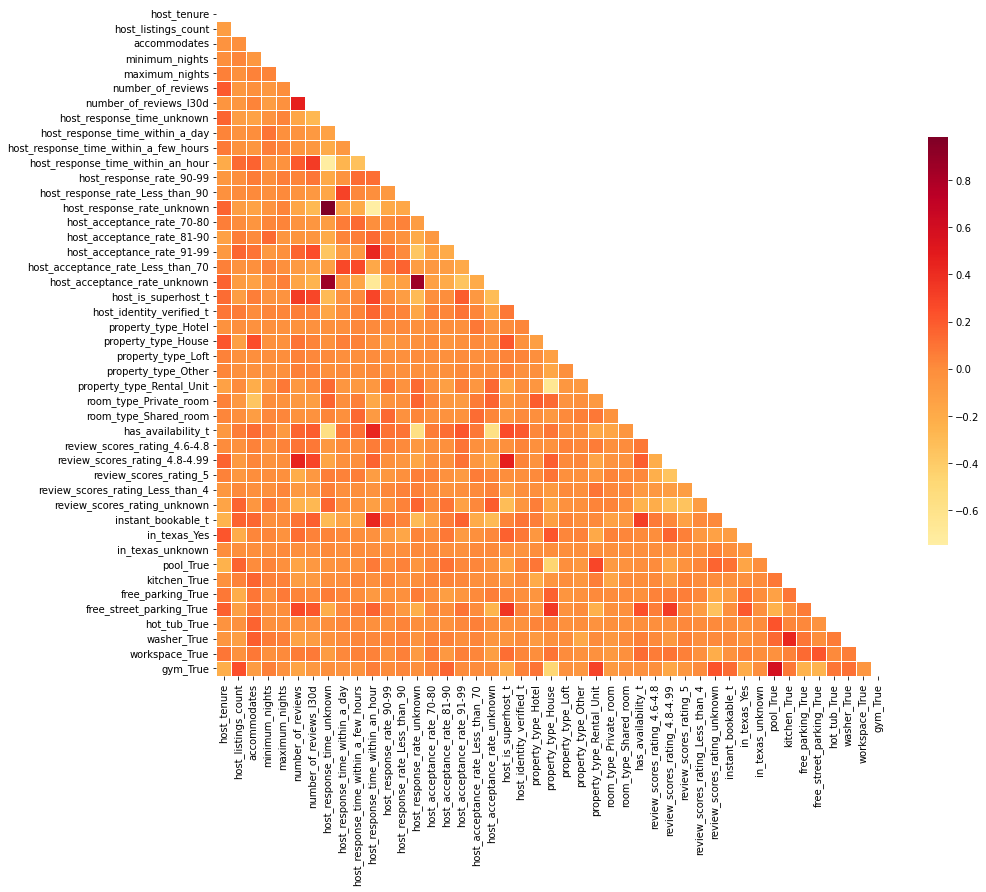

In [436]:
zipcodes = x_train.loc[:, x_train.columns.str.contains('zipcode')].columns
matrix_cols = x_train_std.drop(zipcodes, axis=1)

plt.figure(figsize=(15,15))
corr = matrix_cols.corr()

mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask) ] = True

sns.heatmap(corr, cmap='YlOrRd', mask=mask, center=0, square=True, linewidths=0.5, cbar_kws={"shrink": 0.5})

In [437]:
get_vifs(x_train).head(15)

,Predictor,Variance Inflation Factor
13,host_response_rate_unknown,64.190319
10,host_response_time_within_an_hour,43.640061
7,host_response_time_unknown,43.356595
81,kitchen_True,21.188898
71,has_availability_t,14.065250
85,washer_True,10.110810
65,property_type_House,8.529728
0,host_tenure,7.440383
9,host_response_time_within_a_few_hours,7.013602
18,host_acceptance_rate_unknown,6.783710


In [438]:
x_train['pool_True'].corr(np.log(y_train))

0.07078968988925738

In [439]:
x_train['gym_True'].corr(np.log(y_train))

0.01952890606196009

In [440]:
#Drop collinear predictors
x_train.drop(
    ['host_response_time_within_a_few_hours', 'host_response_time_within_an_hour', 'host_response_time_unknown',
    'host_response_time_within_a_day', 'has_availability_t', 'kitchen_True', 'property_type_House', 
     'host_response_rate_unknown', 'gym_True', 'host_is_superhost_t'], axis=1, inplace=True)

x_valid.drop(
    ['host_response_time_within_a_few_hours', 'host_response_time_within_an_hour', 'host_response_time_unknown',
    'host_response_time_within_a_day', 'has_availability_t', 'kitchen_True', 'property_type_House', 
     'host_response_rate_unknown', 'gym_True', 'host_is_superhost_t'], axis=1, inplace=True)

x_test.drop(
    ['host_response_time_within_a_few_hours', 'host_response_time_within_an_hour', 'host_response_time_unknown',
    'host_response_time_within_a_day', 'has_availability_t', 'kitchen_True', 'property_type_House', 
     'host_response_rate_unknown', 'gym_True', 'host_is_superhost_t'], axis=1, inplace=True)

### Sequential Forward Selection

After removing collinear predictors, there are still insignificant features. In fact,  there are A LOT of features. To find the best subset, I will use forward selection to find the appropriate subset. In short, with sequential forward selection we will find the best regression model for each k subset of predictors. For example, we will find the best simple regression model (k=1) where `price` is the response variable and the predictor that develops the highest coeffecient of determination ($R^{2}$). Lets call this predictor *bestie*. Next, we will find a predictor that, along with *bestie*, that develops the next highest highest $R^{2}$ when `price` is regressed against them. Since there are two predictors in this subset, this is the 2nd subset. We iterate until we reach the maxium length of predictors. Once finished, we plot the R-squared at each subset and determine which one gives use the most information gain. By not including all predictors, we are able to find the most significant subset of them. Also, this method prevents us from overfitting.

In [441]:
model1 = sm.OLS(y_train_log, sm.add_constant(x_train)).fit()
print(model1.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.586
Model:                            OLS   Adj. R-squared:                  0.583
Method:                 Least Squares   F-statistic:                     155.1
Date:                Fri, 17 Jun 2022   Prob (F-statistic):               0.00
Time:                        18:34:50   Log-Likelihood:                -7760.5
No. Observations:                8614   AIC:                         1.568e+04
Df Residuals:                    8535   BIC:                         1.624e+04
Df Model:                          78                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [442]:
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
from sklearn.linear_model import LinearRegression

We can see R-squared begin to slow down at a subset of 18 features. As predicted, `accommodates` contributes to the priving of an Airbnb. As stated before, more area is required to house more people. Therefore, larger groups will pay more. Understandibly, the second and third important features are `room_type_Private_Room` and `room_type_Shared_room`. Typically, rooms are much smaller than enitre buildings; therefore, hosts will charge more. 

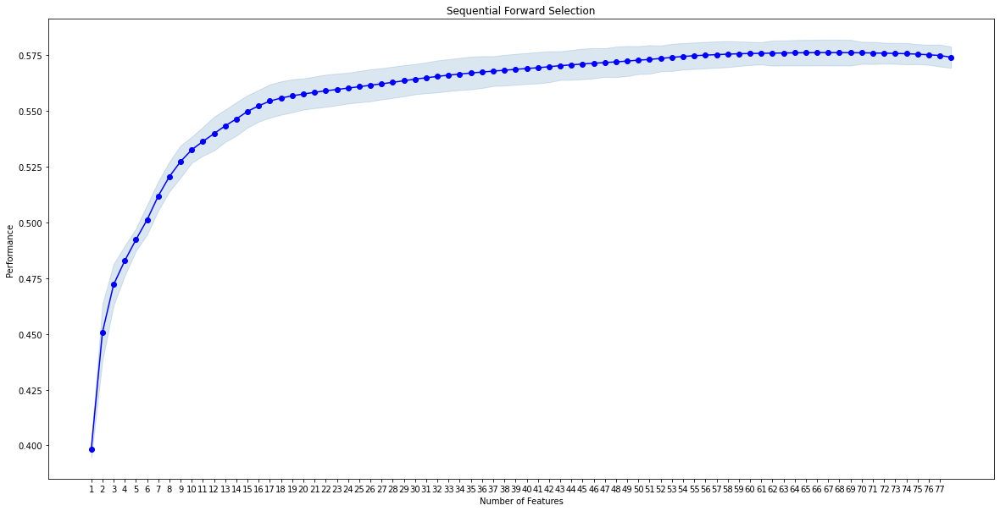

In [443]:
# Initiate sequential forward selection

lr = LinearRegression()
sfs = SFS(
    lr,
    k_features=x_train.shape[1],
    forward=True,
    cv=3
)
sfs.fit(x_train, y_train_log)


plot_sfs(sfs.get_metric_dict(), kind='std_err', figsize=(20,10))
plt.title('Sequential Forward Selection')
_ = plt.xticks(np.arange(1, x_train.shape[1], ))

In [444]:
print('The feature that contributes the most to the price of an Airbnb is: ', list(sfs.subsets_[1]['feature_names'])[0])
print('The two features that contribute the most to the price of an Airbnb are: ', list(sfs.subsets_[2]['feature_names']))
print('The three features that contribute the most to the price of an Airbnb are: ', list(sfs.subsets_[3]['feature_names']))

The feature that contributes the most to the price of an Airbnb is:  accommodates
The two features that contribute the most to the price of an Airbnb are:  ['accommodates', 'room_type_Private_room']
The three features that contribute the most to the price of an Airbnb are:  ['accommodates', 'room_type_Private_room', 'room_type_Shared_room']


Our final model's R-squared is 0.56 with a MSE of 0.378318. For, the MSE is a benchmark we can use to compare to other models. It's essentially the the squared difference between the predicted value and the real value of the data point. Also, our goal of this model was to make it interpretable. We can use the coeffecients to state how a predictor changes the price of an Airbnb. We can do this by transforming the predictor. Let X be predictor of the interested predictor. Then a 1 change increase in X increases the `price` by:

$$100 * (e^{Xcoefficient} - 1)$$

For example, increasing `accommodates` by 1 will increase an Airbnb's price by 15.8%. This can be shown by:

$$100 * (e^{0.1467} - 1) \approx 15.8\%$$

Finally, when testing our model on the validation data we get a MSE of 0.393 and an $R^{2}$ of 0.527.

In [445]:
#Get the best 18 feature combination
linear_features = list(sfs.subsets_[18]['feature_names'])
temp = x_train[linear_features]

model1 = sm.OLS(y_train_log, sm.add_constant(temp)).fit()
print(model1.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.560
Model:                            OLS   Adj. R-squared:                  0.559
Method:                 Least Squares   F-statistic:                     607.6
Date:                Fri, 17 Jun 2022   Prob (F-statistic):               0.00
Time:                        18:35:23   Log-Likelihood:                -8026.7
No. Observations:                8614   AIC:                         1.609e+04
Df Residuals:                    8595   BIC:                         1.623e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

In [446]:
#Get appropriate predictors from validation set
temp_valid = sm.add_constant(x_valid[linear_features])
lin_reg_pred = model1.predict(temp_valid)

#Get MSE and R^2 for validation set
r_squared_lnr = r2_score(y_valid_log, lin_reg_pred)
mse_lnr = mean_squared_error(y_valid_log, lin_reg_pred)

#Append results for final model comparison
fnl_r_squareds.append(r_squared_lnr)
fnl_mse.append(mse_lnr)
fnl_model_name.append('Linear Regression')
print('The MSE of the validation data is: ', mse_lnr)
print('The R^2 of the validation data is: ', r_squared_lnr)

The MSE of the validation data is:  0.3932776361013266
The R^2 of the validation data is:  0.527486096276466


## Ridge Regression

Next, ridge regression is a model which decreases the coefficents of less important features. Essentially, the model conducts its own feature selection by eliminating features that are not contribution to the prediction. Thus, it is a great regression model to run on our dataset. We can control how much we want to decrease the value of the less important features by adjusting the parameter $\alpha$. $\alpha$ has a range of 0 to 1; the larger $\alpha$ is, the more it punishes unimportant predictors. We'll fit a ridge regression model on various values of $\alpha$ and compare their $R^{2}$ and MSE values. It is important to note that I used standardized x-values for this model. As stated before, Ridge Regression uses a strategy that punishes large coefficients; therofre, scaling or predictors allows each predictor to be fairly evaluated. 


$R^{2}$ is approximately 0.58 until $\alpha$ > 1000; beyond 1000, $R^{2}$ begins to decrease dramatically. On the other hand, MSE increases dramatically when $\alpha$ > 1000. Thus, 1000 is the best value for $\alpha$. On the bottom plot we can see how Ridge Regresion works. In summary, shrinks the unimportant predictors. The faster a predictor converges to 0, the less important it is.  We can see `accommodates` and `room_type_Private_room` have large weights. Also, compared to other predictors, they fail to converge close to 0. Thus, the model suggests these predictors are the most important in predicting the price in Airbnb.

In [447]:
def get_ridge_coefs(cols, ridge_model_ins, sortby ='coef', ascend=False):
    """
        return sorted ridge coefficients and their associated features
        
        cols: names of the features
        ridge_model_ins : instance of a ridge regression model
        ascend If True, will return dataframe sorted with the smallest value first
        sortby: How to sort the dataframe
                - 'coef': sorts dataframe by features coefficient value
                - 'magnitude': sorts by the absolute value of the coefficient
    """
    #get indices of sorted coefficients, smallest to largest
    coefs_temp = ridge_model_ins.coef_
    coefs_inds_sorted = np.argsort(coefs_temp)
    
    #sort features and coefficents from smallest to largest
    coefs_sorted = coefs_temp[coefs_inds_sorted]
    features_sorted = cols[coefs_inds_sorted]
    
    #Place coefficients in Dataframe
    coefficients = pd.DataFrame(zip(features_sorted, coefs_sorted), columns=['feature', 'coef'])
    coefficients['magnitude'] = abs(coefficients['coef'])
    
    return coefficients.sort_values(by=sortby, ascending=ascend)
        


Text(0.5, 1.0, 'Ridge coefficients as a function of the regularization')

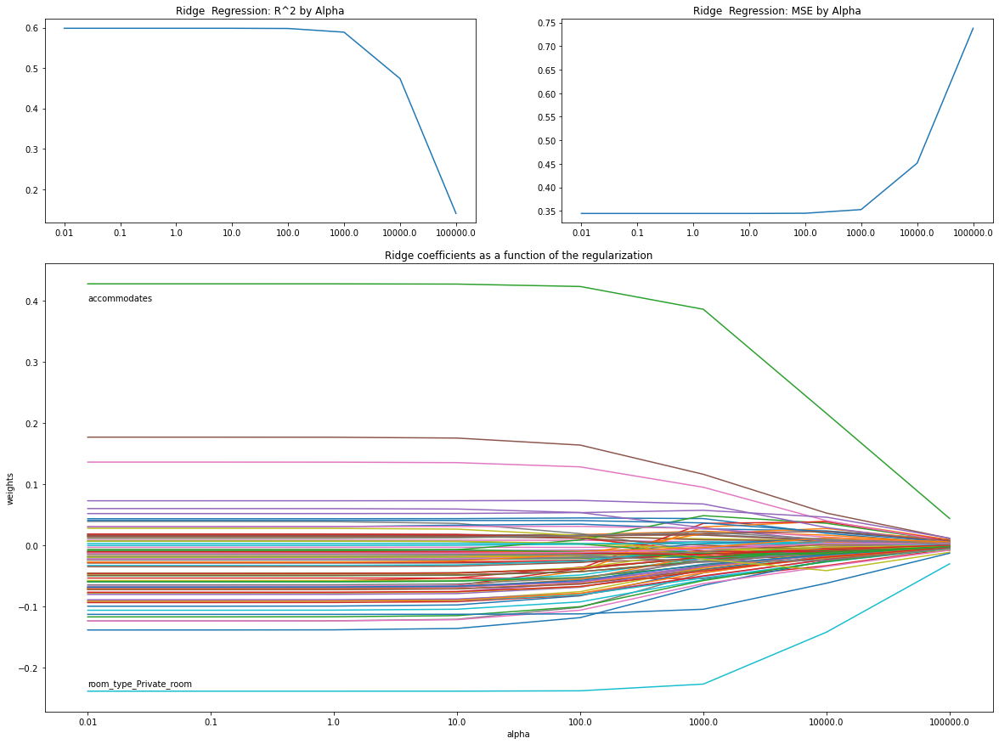

In [448]:
#Values of our hyperparameter
alpha_list = []

#Store R^2 for different alphas
r_squared = []

#Store R^2 for different alphas
mse = []

#Store coefficients of the model
coefs = []

#Largest and smallest coefficient 
max_coef = None
min_coef = None

for i in range (-2,6):
    #Get alpha
    alpha = 10**i
    
    #Fit Ridge Model
    rm = linear_model.Ridge(alpha=alpha)
    ridge_model = rm.fit(x_train_std, y_train_log)
    
    #make predictions
    preds_ridge = ridge_model.predict(x_train_std)
    
    #get max, and min
    if i == 5:
        feature_df = get_ridge_coefs(x_train_std.columns, ridge_model )
        
        #get min and max features
        min_coef1 = feature_df['feature'].iloc[-1]
        max_coef1 = feature_df['feature'].iloc[0]

    #store values for each alpha
    alpha_list.append(alpha)
    r_squared.append(ridge_model.score(x_train_std, y_train_log))
    mse.append(mean_squared_error(y_train_log, preds_ridge))
    coefs.append(ridge_model.coef_)

#Dataframe of results for alpha
results = pd.DataFrame(zip(alpha_list, r_squared, mse), columns=['Alpha', 'R^2', 'MSE'])
results['Alpha'] = results['Alpha'].astype('str')


#Instantiate flexible figure
fig = plt.figure(figsize=(20,15))
grid = fig.add_gridspec(3, 2)
ax0 = fig.add_subplot(grid[0, 0])
ax1 = fig.add_subplot(grid[0, 1])
ax2 = fig.add_subplot(grid[1:, :])

#Plot R^2
ax0.plot(results["Alpha"], results['R^2'])
ax0.set_title("Ridge  Regression: R^2 by Alpha")

#Plot MSE
ax1.plot(results["Alpha"], results['MSE'])
ax1.set_title("Ridge  Regression: MSE by Alpha")

#Plot Coefficients by alpha
ax2 = plt.gca()
ax2.plot(results["Alpha"], coefs)
ax2.set_xlabel("alpha")
ax2.set_ylabel("weights")

#Add largest and smallest coefficnet annotations
ax2.annotate(text=max_coef1, xy=(0,0.4))
ax2.annotate(text=min_coef1, xy=(0, -0.23))
ax2.set_title("Ridge coefficients as a function of the regularization")

For our final ridge regression model $\alpha$ = 1000. This results in an MSE of 0.3638 and a $R^{2}$ of 0.5628. This is an improvement from our Linear Regression model.

In [449]:
#Fit with best Alpha
rm = linear_model.Ridge(alpha=1000)
ridge_model = rm.fit(x_train_std, y_train_log)
preds_ridge = ridge_model.predict(x_valid_std)

#Get R^2 and MSE
final_ridge_r_squared = ridge_model.score(x_valid_std, y_valid_log)
final_mse = mean_squared_error(y_valid_log, preds_ridge)

#Store for final model comparison
fnl_r_squareds.append(final_ridge_r_squared)
fnl_mse.append(final_mse)
fnl_model_name.append('Ridge Regression')

print('The MSE of our final ridge model is ', final_mse)
print('The R^2 of our final model is ', final_ridge_r_squared)

#Table visualization of Coefficients
ridge_coefs = get_ridge_coefs(x_train_std.columns, ridge_model, sortby='magnitude')
ridge_coefs.head(6)

The MSE of our final ridge model is  0.36385915042551825
The R^2 of our final model is  0.562831720416481


,feature,coef,magnitude
87,accommodates,0.385814,0.385814
0,room_type_Private_room,-0.227003,0.227003
86,property_type_House,0.116002,0.116002
1,room_type_Shared_room,-0.104623,0.104623
85,review_scores_rating_unknown,0.094790,0.094790
84,property_type_Hotel,0.067476,0.067476


## Extreme Gradient Boosted Decision Trees (XGBoost)

Decision Trees are known as one of the most interpretable models. By starting at the root node, one can travel down stems asking themself whether or not they meet a certain criteria. Once you reach a leaf, you know what your output should be. XGBoost follows a similar pattern except it creates an ensemble of trees while using 'boosting'to create the best model. 'Boosting' refers to a sequential technique in which an ensemble model takes a bunch of 'weak learners' and attempts to improve its predecessor. The model I chose, XGBoost using Regression, attempts to accomplish the task by reducing the difference between the prediction and the true value. For our task, this is the residuals of error.

Overall, XGBoost is great for our trask as it is easy to interpret, has string prediction power and can be resistant to overfitting.  However, our data has a few outliers and XGBoost is sensitive to that. To begin, we need to instantiate our model.

In [450]:
import xgboost as xgb

Before adjusting any hyperparameters, we can see that our model predicts fairly well. However, XGBoost regressors can easily overfit the training data. We can review this once we test our final moel against the validation. Now, we need to find appropriate values for hyperparameter we will use in our model. Hyper models are variables we can adjust to fine tune our model. Below we will create plots to evaluate the the performance of the model with different values regarding:
   - **reg_lambda**: this can be thought of as a regularization term on the size of the coefficients/weights. This parameter is similar to alpha in the Ridge Regression model we completed beforehand
   - **eta**: this is the learning rate in the model Think of this as preventing us from overfitting the data. Overfitting is an issue where our model predicts well on our training data, but fails to generalize to unseen data. The learning rate helps us shrink the new weights received on an iteration. Having one too large results in more iterations until we reach the best value. This process takes longer, and we may never get to the optimized value. On the other hand, a smaller learning rate can result in growing weights too fast. This can cause us to miss the boptimized value completly.
   - **gamma**: gamma is another regularization parameter. Basically, it's the minimum information gain (or what many call 'loss reduction) required to split a node. It's essentially a pruning technique. The larger gamma is, the more difficult it will be for a tree to split nodes.
   - **max_depth**: The number of levels a tree can have. The larger the number, the more likely it is to over fit
   - **n_estimators**: number of trees in our ensemble


Similar to the other models, our goal is to mimimize squared error.

In [451]:
#Fit model
xgb_regressor = xgb.XGBRegressor()
xgb_regressor.fit(x_train, y_train_log)

#Make predictions
xgb_preds = xgb_regressor.predict(x_train)

print("MSE: ", mean_squared_error(y_train_log, xgb_preds))
print("R^2: ", r2_score(y_train_log, xgb_preds))

MSE:  0.13028960249860458
R^2:  0.8481216787556805


As with Ridge Regression, we find the value of the hyper parmeter when $R^2$ is either at its highest value or close to it withe a slope close to 0. On the other hand, viewing the MSE plot, we want the value where the plot is at it's lowest and beginning to flat. Therefore, the following plots give us the following values as the best values for our hyperparameters:
   - **reg_lambda**: 125
   - **eta (learning_rate)**: 0.2
   - **gamma**: 1
   - **max_depth**: 8
   - **n_estimators**: 50

[]

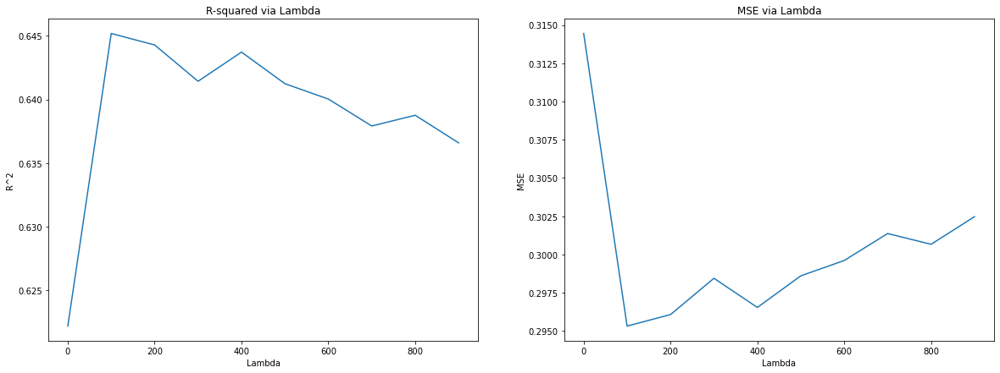

In [452]:
lambda_ = []
r_squared = []
mse = []

#Plot of MSE and R^2 of different values of Lambda
for i in range (0,1000, 100):
    xgb_regressor = xgb.XGBRegressor(objective='reg:squarederror', reg_lambda = i)
    xgb_regressor.fit(x_train, y_train_log)
    xgb_preds = xgb_regressor.predict(x_valid)
    
    lambda_.append(i)
    mse.append(mean_squared_error(y_valid_log, xgb_preds))
    r_squared.append(r2_score(y_valid_log, xgb_preds))

fig,ax = plt.subplots(1,2, figsize=(20,7))
ax[0].plot(lambda_, r_squared)
ax[0].set_title("R-squared via Lambda")
ax[0].set_xlabel("Lambda")
ax[0].set_ylabel('R^2')
ax[1].plot(lambda_, mse)
ax[1].set_xlabel("Lambda")
ax[1].set_ylabel('MSE')
ax[1].set_title("MSE via Lambda")
plt.plot()

[0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8]


[]

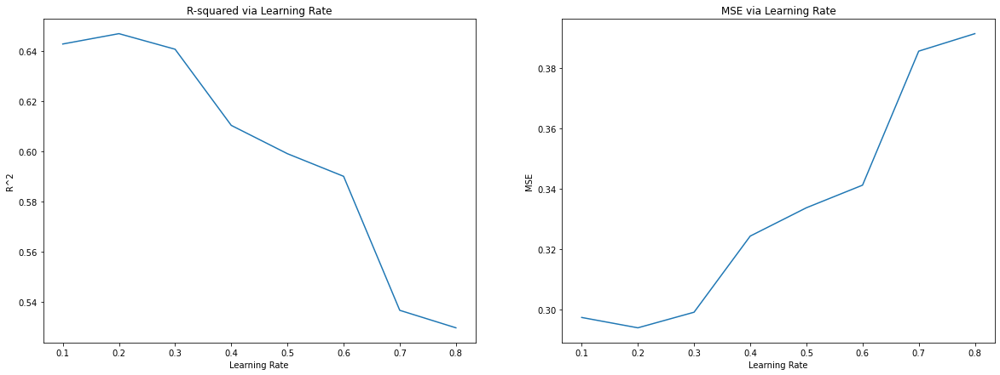

In [453]:
eta=np.arange(0.1, 0.9, 0.1)
print(eta)
r_squared = []
mse = []

#Plot of MSE and R^2 of different values of the Learning Rate
for i in eta:
    xgb_regressor = xgb.XGBRegressor(objective='reg:squarederror', eta=i)
    xgb_regressor.fit(x_train, y_train_log)
    xgb_preds = xgb_regressor.predict(x_valid)
    
    mse.append(mean_squared_error(y_valid_log, xgb_preds))
    r_squared.append(r2_score(y_valid_log, xgb_preds))

fig,ax = plt.subplots(1,2, figsize=(20,7))
ax[0].plot(eta, r_squared)
ax[0].set_title("R-squared via Learning Rate")
ax[0].set_xlabel("Learning Rate")
ax[0].set_ylabel('R^2')
ax[1].plot(eta, mse)
ax[1].set_xlabel("Learning Rate")
ax[1].set_ylabel('MSE')
ax[1].set_title("MSE via Learning Rate")
plt.plot()

[]

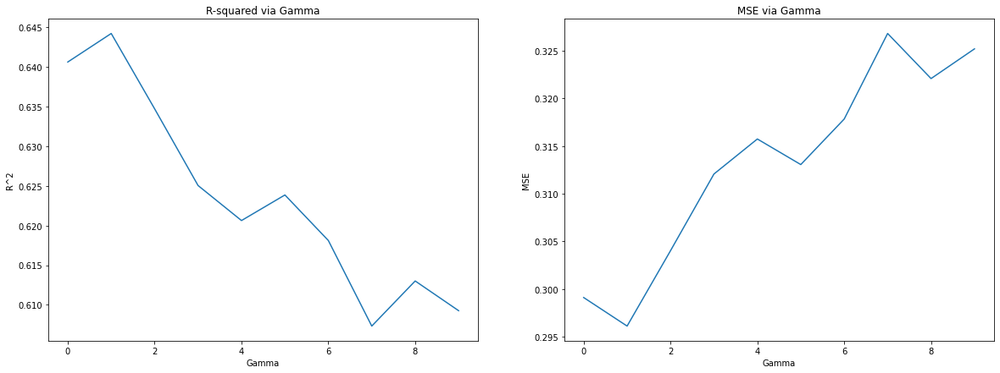

In [454]:
gamma=np.arange(0,10, 1)
r_squared = []
mse = []

#Plot of MSE and R^2 of different values of Gamma
for i in gamma:
    xgb_regressor = xgb.XGBRegressor(objective='reg:squarederror', gamma=i)
    xgb_regressor.fit(x_train, y_train_log)
    xgb_preds = xgb_regressor.predict(x_valid)
    
    mse.append(mean_squared_error(y_valid_log, xgb_preds))
    r_squared.append(r2_score(y_valid_log, xgb_preds))

fig,ax = plt.subplots(1,2, figsize=(20,7))
ax[0].plot(gamma, r_squared)
ax[0].set_title("R-squared via Gamma")
ax[0].set_xlabel("Gamma")
ax[0].set_ylabel('R^2')
ax[1].plot(gamma, mse)
ax[1].set_xlabel("Gamma")
ax[1].set_ylabel('MSE')
ax[1].set_title("MSE via Gamma")
plt.plot()

[]

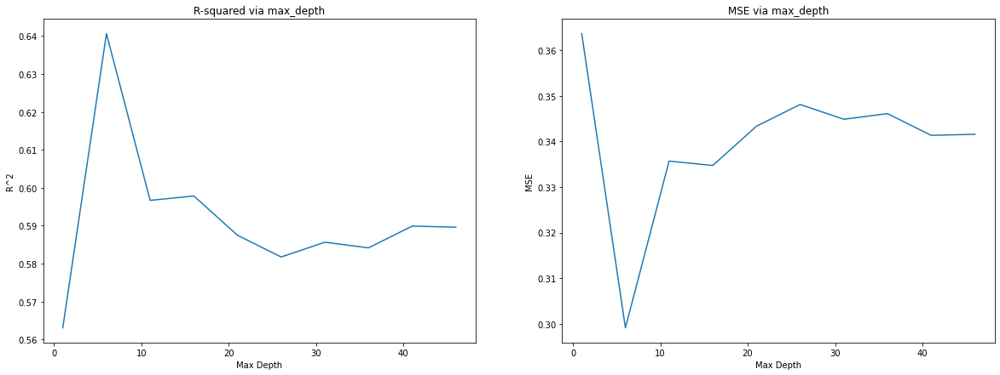

In [455]:
depth=np.arange(1,50, 5)
r_squared = []
mse = []

#Plot of MSE and R^2 of different values of max_depth
for i in depth:
    xgb_regressor = xgb.XGBRegressor(objective='reg:squarederror', max_depth=i)
    xgb_regressor.fit(x_train, y_train_log)
    xgb_preds = xgb_regressor.predict(x_valid)
    
    mse.append(mean_squared_error(y_valid_log, xgb_preds))
    r_squared.append(r2_score(y_valid_log, xgb_preds))

fig,ax = plt.subplots(1,2, figsize=(20,7))
ax[0].plot(depth, r_squared)
ax[0].set_title("R-squared via max_depth")
ax[0].set_xlabel("Max Depth")
ax[0].set_ylabel('R^2')
ax[1].plot(depth, mse)
ax[1].set_xlabel("Max Depth")
ax[1].set_ylabel('MSE')
ax[1].set_title("MSE via max_depth")
plt.plot()

[]

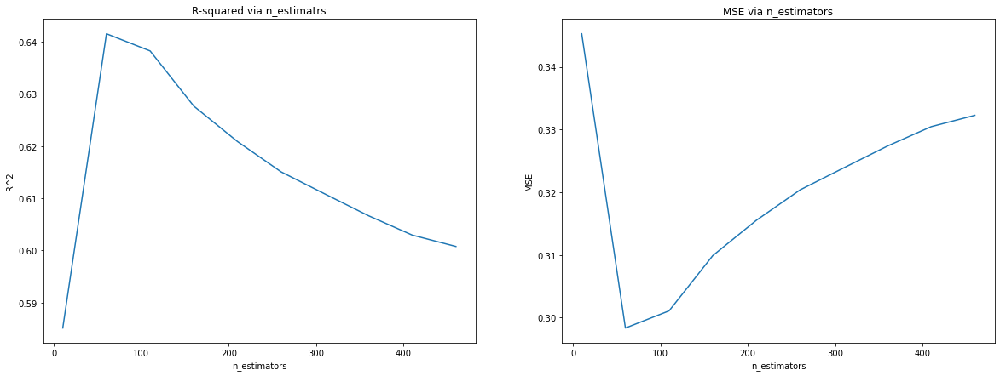

In [456]:
estimator_counts=np.arange(10,500, 50)
r_squared = []
mse = []

#Plot of MSE and R^2 of different values of n_estimators
for i in estimator_counts:
    xgb_regressor = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=i)
    xgb_regressor.fit(x_train, y_train_log)
    xgb_preds = xgb_regressor.predict(x_valid)
    
    mse.append(mean_squared_error(y_valid_log, xgb_preds))
    r_squared.append(r2_score(y_valid_log, xgb_preds))

fig,ax = plt.subplots(1,2, figsize=(20,7))
ax[0].plot(estimator_counts, r_squared)
ax[0].set_title("R-squared via n_estimatrs")
ax[0].set_xlabel("n_estimators")
ax[0].set_ylabel('R^2')
ax[1].plot(estimator_counts, mse)
ax[1].set_xlabel("n_estimators")
ax[1].set_ylabel('MSE')
ax[1].set_title("MSE via n_estimators")
plt.plot()

In [457]:
#Fit final model
xgb_regressor = xgb.XGBRegressor(objective='reg:squarederror', reg_lambda=125, eta=0.2, gamma=1,
                                max_depth=8, n_estimators=50)
xgb_regressor.fit(x_train, y_train_log)

#Predictions of validation and training set
xgb_preds = xgb_regressor.predict(x_train)
xgb_preds_valid = xgb_regressor.predict(x_valid)

#MSE and R^2 of training set
fnl_mse_xgb = mean_squared_error(y_train_log, xgb_preds)
fnl_r_squared_xgb = r2_score(y_train_log, xgb_preds)

#MSE and R^2 of validation set
fnl_mse_xgb_valid = mean_squared_error(y_valid_log, xgb_preds_valid)
fnl_r_squared_xgb_valid = r2_score(y_valid_log, xgb_preds_valid)


fnl_r_squareds.append(fnl_r_squared_xgb_valid)
fnl_mse.append(fnl_mse_xgb_valid)
fnl_model_name.append('XGB Regressor')

print('The MSE of our final on the Training Data XGB model is ', fnl_mse_xgb)
print('The R^2 of our final on the Training Data XGB model is ', fnl_r_squared_xgb)
print("--------------------------------------------")
print('The MSE of our final on the Validation Data XGB model is ', fnl_mse_xgb_valid)
print('The R^2 of our final on the Validation Data XGB model is ', fnl_r_squared_xgb_valid)

The MSE of our final on the Training Data XGB model is  0.2543476430970742
The R^2 of our final on the Training Data XGB model is  0.7035074763817266
--------------------------------------------
The MSE of our final on the Validation Data XGB model is  0.30197739157688774
The R^2 of our final on the Validation Data XGB model is  0.6371812098324292


# Model Decision and Final Tuning

In [458]:
from sklearn.model_selection import GridSearchCV

Overall, we can see the XGBoost model performed better than both regression models. XGBoost can catch irregularities within the data. Ridge Regression and linear regression perform better when the dependent variable can be expressed as a combination of the predictors. However, as we saw earlier, our data didn't necessarily fit a completly linear model. Because it is nonparameteric, XGB catches the irregularity of the data relation better than either linear model.

In [459]:
model_metrics_df = pd.DataFrame(zip(fnl_model_name, fnl_r_squareds, fnl_mse), columns = ['Model', 'R^2', 'MSE'])
model_metrics_df

,Model,R^2,MSE
0,Linear Regression,0.527486,0.393278
1,Ridge Regression,0.562832,0.363859
2,XGB Regressor,0.637181,0.301977


### Fine tuning Parameters
We attempted to find the best combination of hyperparameters earlier. However, we only tested our metrics for each hyperparameter individually. We can use `GridSeachCV` to test differen combinations of our hyperparameters for the best result. Our results from the search are:
   - **reg_lambda**: 5
   - **eta (learning_rate)**: 0.1
   - **gamma**: 1
   - **max_depth**: 10
   - **n_estimators**: 100

In [460]:
#parameters for GridSearchCV
parameters = {
    
    'reg_lambda': [5, 50, 100, 200],
    'learning_rate': [0.1,0.2,0.3],
    'gamma': [1, 2, 3],
    'max_depth': [5, 10, 15],
    'n_estimators' : [20, 50, 100]
}

In [461]:
#Commented out for timing issues

# clf = GridSearchCV(xgb, parameters, n_jobs=5, cv=3, scoring = 'r2', verbose=2)
# clf.fit(x_train, y_train_log)

In [462]:
#Commented out for timing issues: the params for thes test were shown above

# print(f'The best possible score given the different hyperparameters is: {clf.best_score_}')
# print(f'The best parameters are: {clf.best_params_}')

### Fitting with final model parameters
Finally, we can fit our data with the best hyperparameters. Our final model test results in a MSE of

In [463]:
final_model = xgb.XGBRegressor(objective='reg:squarederror', reg_lambda=5, eta=0.1, gamma=1,
                               max_depth=10, n_estimators=100)
final_model.fit(x_train, y_train_log)

final_model_preds = final_model.predict(x_valid)

fnl_mse = mean_squared_error(y_valid_log, final_model_preds)
fnl_r_squared = r2_score(y_valid_log, final_model_preds)

print('The MSE of our final on the Validation Data XGB model is ', fnl_mse)
print('The R^2 of our final on the Validation Data XGB model is ', fnl_r_squared)

The MSE of our final on the Validation Data XGB model is  0.2936062178998558
The R^2 of our final on the Validation Data XGB model is  0.6472389796870643


### Feature Importance

When comparing our training set MSE and R-squared vs our validation set, our training set MSE is slightly higher. This may be due to slight overfitting. We can improve the model by reducing the number of features.


The importance is a score given to a feature for the amount the attribute's pslit point improves the model performance. The score for each attribute is then averaged across all models.

Our final model tends to agree with the decisions our ridge/linear regressions made.`Accommodates`, `room_type_Private_room`, and `room_typ_Shared_room` are, understandibly, the most important features in the model. As stated before, more people require more room on a property. If you have less room, you'll pay less for property. Many zipcodes, and being unaware of the hosts home location are not important in the pricing of the Airbnb.

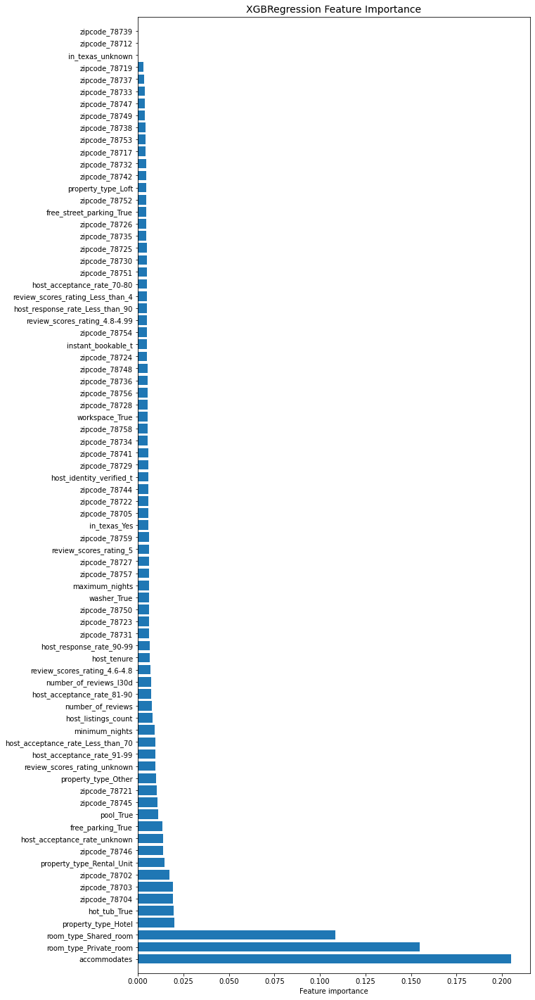

In [464]:
#Get feature importance and sort from smallest to Largest
feature_weights = pd.DataFrame(zip(x_train.columns, final_model.feature_importances_), columns=['Feature', 'Importance'])
feature_weights = feature_weights.sort_values('Importance', ascending=False)

plt.figure(figsize=(10,25))
plt.barh(feature_weights['Feature'], feature_weights['Importance'], align='center') 
plt.title("XGBRegression Feature Importance", fontsize=14)
plt.xlabel("Feature importance")
plt.margins(y=0.01)
plt.show()

# Feature Reduction

As we stated before, your model overfits the data. Lets test different subset sizes of our dataset to reduce the overfitting. From the plots below, our $R^{2}$ is begins to stay around 65 at 30 predictors. Again, the MSE states the same.

[]

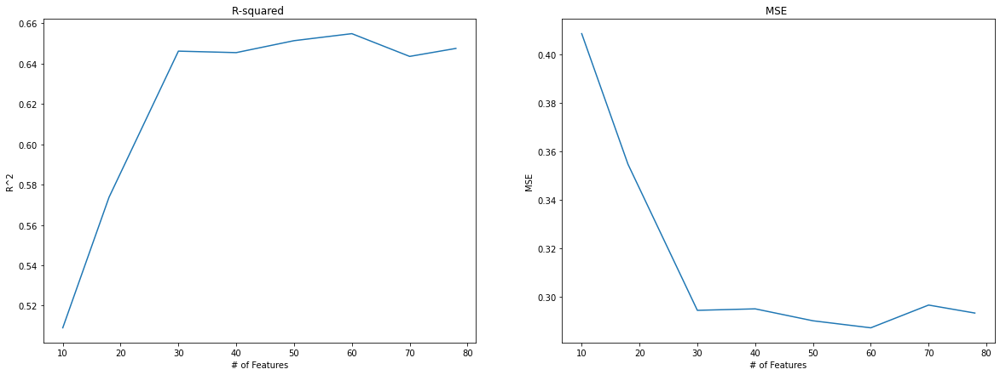

In [465]:
# list of number of features to loop over
feature_counts = [10, 18, 30, 40, 50, 60, 70, 78]

mse = []
r_squared = []
for i in feature_counts:
    
    #get the subset of features
    cols = feature_weights['Feature'][0:i]
    subset_train = x_train[cols]
    subset_valid = x_valid[cols]
    
    #Fit and get predictions with feature subset
    xgb_regressor =  xgb.XGBRegressor(objective='reg:squarederror', reg_lambda=5, eta=0.1, gamma=1,
                                      max_depth=10, n_estimators=100)
    xgb_regressor.fit(subset_train, y_train_log)
    xgb_preds = xgb_regressor.predict(subset_valid)
    
    #Get MSE and R^2 for each feature subset
    mse.append(mean_squared_error(y_valid_log, xgb_preds))
    r_squared.append(r2_score(y_valid_log, xgb_preds))

#Plot subplots
fig,ax = plt.subplots(1,2, figsize=(20,7))
ax[0].plot(feature_counts, r_squared)
ax[0].set_title("R-squared ")
ax[0].set_xlabel("# of Features")
ax[0].set_ylabel('R^2')
ax[1].plot(feature_counts, mse)
ax[1].set_xlabel("# of Features")
ax[1].set_ylabel('MSE')
ax[1].set_title("MSE ")
plt.plot()

## Final Model after Feature Reduction

Reducing the number of features in our model can help prevent overfitting. With less predictors, we can generalize to unseen data better. Even with removing over half of our features, our Adjusted R-squared stays around 65%.

In [466]:
#Create final predictors with chosen subset amount
cols = feature_weights['Feature'][0:30]
subset_train = x_train[cols]
subset_valid = x_valid[cols]

#Fit Final model and get predictions
xgb_final =  xgb.XGBRegressor(objective='reg:squarederror', reg_lambda=5, eta=0.1, gamma=1,
                                  max_depth=10, n_estimators=100)
xgb_final.fit(subset_train, y_train_log)
xgb_preds = xgb_final.predict(subset_valid)


print('The MSE of our final on the Validation Data XGB model is ', mean_squared_error(y_valid_log, xgb_preds))
print('The R^2 of our final on the Validation Data XGB model is ', r2_score(y_valid_log, xgb_preds))

The MSE of our final on the Validation Data XGB model is  0.2944711392678445
The R^2 of our final on the Validation Data XGB model is  0.6461997968439877


## Testing our final model

Now that we have our final model. We can test it on our test data. Keeping a separate dataset from being used helps use test our model on data we haven't seen before.


In [467]:
x_test = x_test[cols]
test_preds = xgb_final.predict(x_test)

print('The MSE of our final on the Validation Data XGB model is ', mean_squared_error(y_test_log, test_preds))
print('The R^2 of our final on the Validation Data XGB model is ', r2_score(y_test_log, test_preds))

The MSE of our final on the Validation Data XGB model is  0.28863948263390005
The R^2 of our final on the Validation Data XGB model is  0.6557908804179018


# Conclusion

First, below we can see one of the decision tress from our model. We can confirm the top 3 features in our importance plot are used as nodes in the graph. In fact, the number of travelers is used to split 3 out of the five nodes. The values in the leaves are the outputs. They represent the prediction for that tree. For a data point, our model sums all the values from all of the trees to give a prediction.. Hence, for this tree if we had a group of less than 3 people and we rented a private room, our prediction would be 0.3886. Also note, our model has a learning rate of 0.1. Therefore, before the learning rate was applied, the prediction would have been 3.8.

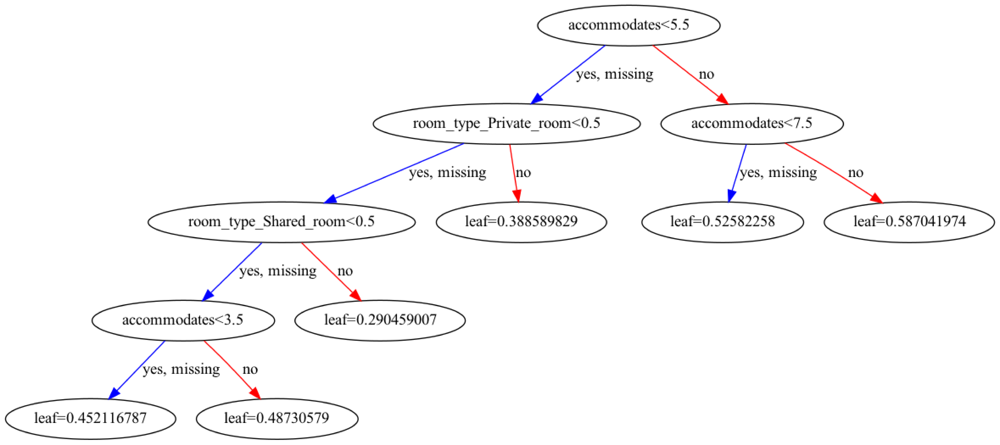

In [482]:
from xgboost import plot_tree
plot_tree(xgb_final, feature_names=subset_train.columns, num_trees=0)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(150, 250)
fig.savefig('imgs/tree.png')

### Model Summary
Our final model was able to predict 65% of the variation in price with an MSE of 0.29. The 5 most important features are:
   - `accommodates`: the number of people staying at the rental
   - `room_type_Private_room`: if the rental was a private room orn not
   - `room_type_Shared_room`: if the rental was a Shared room or not
   - `property_type_Hotel_room`: whether the rental was a hotel room or not
   - `hot_tub_True`: Whether the property has a hot tub or not. 

It's understandable that the number of people staying at the rental is the most important characteristic to pricing. Typically, this is the first search parameter renters look for. Also, it makes sense the type of room would affect the pricing. When renting a room instead of an entire property the tenants is using less space;therofre, hosts will charge their tenant less.

Next, it's not surprising that hotel room appeared in one of the most important features. Airbnb began as a cheaper alternative to hotels. Thus, charging for a hotel room on Airbnb would be more expensive than going through the hotel itself. Last, hot_tubs are a luxury amenity. So, for a host to charge more for having one is not surprising. 

We can see that the host home location is not related much to the pricing of the house. Thus, hosts do a great job of charging thier tenants a good market price instead of the price that fits their home location's market. The location of the property itself seems to have a small amount of influence on pricing. `Zipcode` 78704, 78703, 78702 and 78746 are all located within the western area of Austin. All 4 of these zipcodes are heavily conisdered when pricing properties

### What Didn't Work?
The goal of the model was to make it predictable and interpretable. In the end, we sacrificed some interpretability to fit a predictable model. From the beginning, it was obvious the relationship between or predictors and dependent variable were not linear. Thus, we have to log transform our dependent. Although this method does improce the model, it is not preferred. Also, much of our data was collinear. Many variables represented similar aspects of the listings. For example, we had about 10 predictors that represented the number of review for a listing. We also had about 15 variables representing the hosts resonse rate and time. It would have helped to have more features regarding the physical aspect of the house itself.

### What about the Unexplained Variance?

The unexplained variance could be due to several of the following reasons:
   1. Our dataset didn't capture all of the important features regarding Airbnb pricing. A lot of our features relied on the attributes of the host and reviews online. However, we didn't have much information about the buildings themselves. Looking back at our most important features of our model, the top 10 features dealt with physical characteristics of the property or their location. Thus, we know the physical charcteristics are much more important than the host or reviews left on line.
   2. Inconsistencies in the user data. Within our dataset there were a few small 1 bedroom, 1 bath non-luxury apartments with advertised prices of 10000 dollars a night. Sometimes hosts list their properties at a very high prices to avoid anyone from renting their property. Also, people sometimes make errors when pricing their rentals. An extra 0 may be added or a similar mistake may be made. However, we couldn't drop the observations because we couldn't confirm if they were errors or not. If we had access to he actual paid price for these listings, we would have much more accurate data. 
   3. Typically, when someone rents an Airbnb they are wanting to enjoy the town. For future models, incorportating vicinity to attractions would be great to model. Also, the vicinity to neighbors may help as well

### Future Reccommendations

When creating the model, we eliminated many features regarding reviews and descriptions of the lisitngs. For future studiess, text analysis can be used to discover relationships between the text of reviews and the pricing of a property. Also, analysis regarding the text of the house descriptions can be used. What key words are used to attract tenants? Is it related to the housing price? Last, our model was built regarding the housing in Austin, Texas. Future stdies could compare the costs of different cities. Are different features more important in different areas?

## Further Review

It has been a few months and I thought I'd go back over my project and touch on what I would do differently. As this is a large project, I would like to correct some mistakes and apply some new techniques

1. Initial Feature Selection
    - Instead of viewing histograms of each variable, I would apply some better techniques. Future projects will have much more variables; therefore, I will not have the time to individually look at each one via graph. Some more importance techniques I would implement are
        - Zero Variance Selection
        - Clustering of features to find similar ones. Remove all but one from each group
        - Random Forest Feature Importance
        - Significant features from a dendogram
2. When looking at my linear regression model diagnostics, the plot for "Residuals vs Fitted" seems to be vertically truncated. Also, it seems I was too focused on the centralization of the data points that I didn't notice the extremely positive residuals for lower predicted values and extremely negative residuals for higher predicted values.
    - Using a QQ-plot along with the other 2 plots would have been very beneficial
    - Looking back at my initial data analysis, I would of benefited from capping my dependent variable. There's not much data for prices above 800 dollars nor below 100 dollars. Fixing this issue could have resulted in a better linear model model.
    
3. Since I would have more time, I would test out different interactions between variables in the linear model. For example, I'm sure an interaction variable associated with room type and the # of accomodates would be significantly important as I'm sure the two are related.
    - Methods such as ANOVA, random forest selection or categorized boxplots would help